MobileNetV2 EPOCH 50 BATCHSIZE 32

Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_6[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                   

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


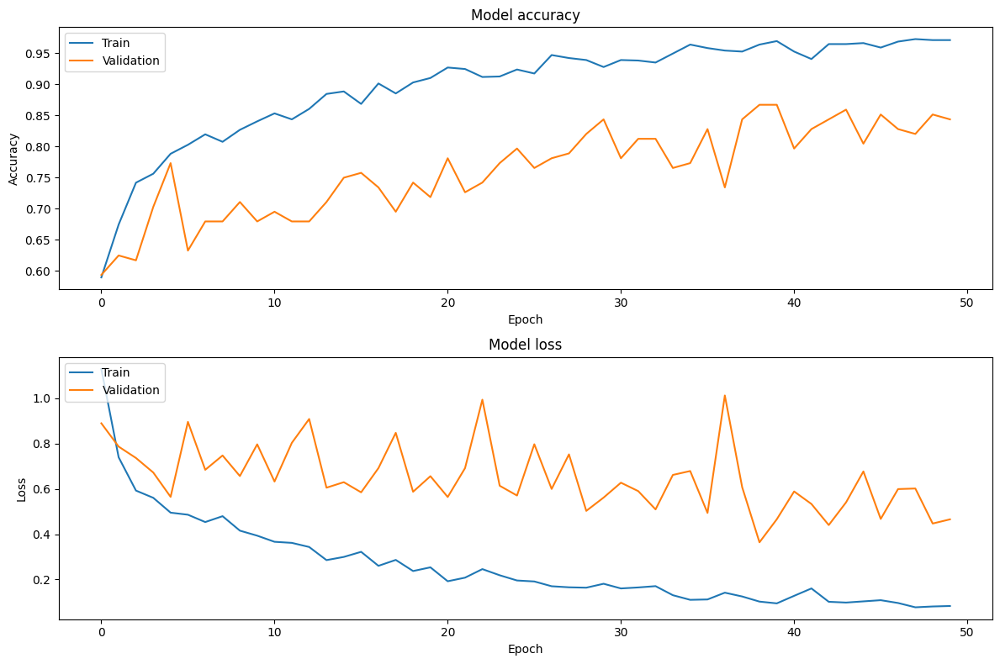

5/5 [==============================] - 4s 616ms/step


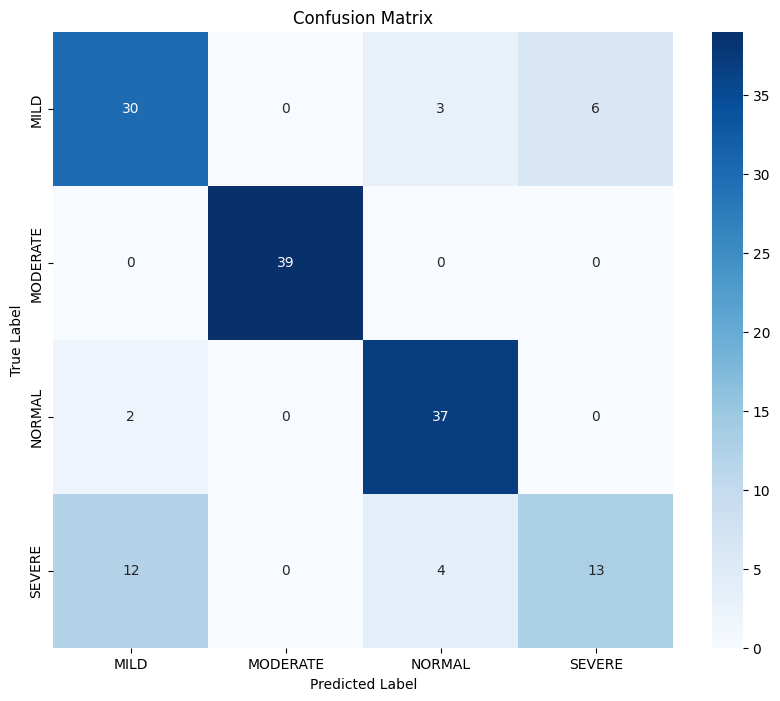

              precision    recall  f1-score   support

        MILD       0.68      0.77      0.72        39
    MODERATE       1.00      1.00      1.00        39
      NORMAL       0.84      0.95      0.89        39
      SEVERE       0.68      0.45      0.54        29

    accuracy                           0.82       146
   macro avg       0.80      0.79      0.79       146
weighted avg       0.81      0.82      0.81       146

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_6[0][0]']             
                                                     

In [10]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report

# Data directories
train_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1"
val_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\VAL 1"
test_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TEST 1"

# Define ImageDataGenerator for preprocessing and augmentation
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0/255.0)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Load pre-trained model and modify the final layer for our task
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(len(train_generator.class_indices), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=val_generator,
    validation_steps=val_generator.samples // val_generator.batch_size,
    epochs=50
)

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(
    test_generator,
    steps=test_generator.samples // test_generator.batch_size
)

print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')

# Save the trained model
model.save('glaucoma4_classification_model.h5')

# Plot and save training history
plt.figure(figsize=(12, 8))

# Plot training & validation accuracy values
plt.subplot(2, 1, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(2, 1, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.savefig('training_history.png')
plt.show()

# Make predictions on the test data
predictions = model.predict(test_generator, steps=len(test_generator))
predicted_classes = tf.argmax(predictions, axis=1).numpy()

# Get true labels
true_classes = test_generator.classes[:len(predicted_classes)]
class_labels = list(test_generator.class_indices.keys())

# Compute confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.savefig('confusion_matrix.png')
plt.show()

# Classification report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Print the model summary again to show trainable and non-trainable parameters
model.summary()


MobileNetV2 EPOCH 100 BATCHSIZE 32

Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_1[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                     

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


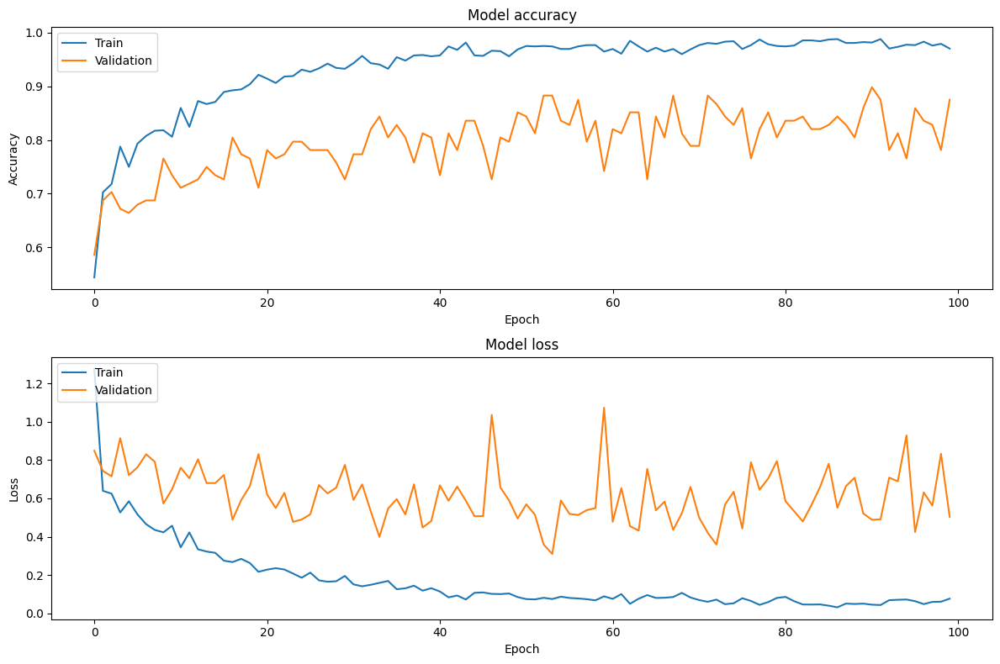

5/5 [==============================] - 4s 496ms/step


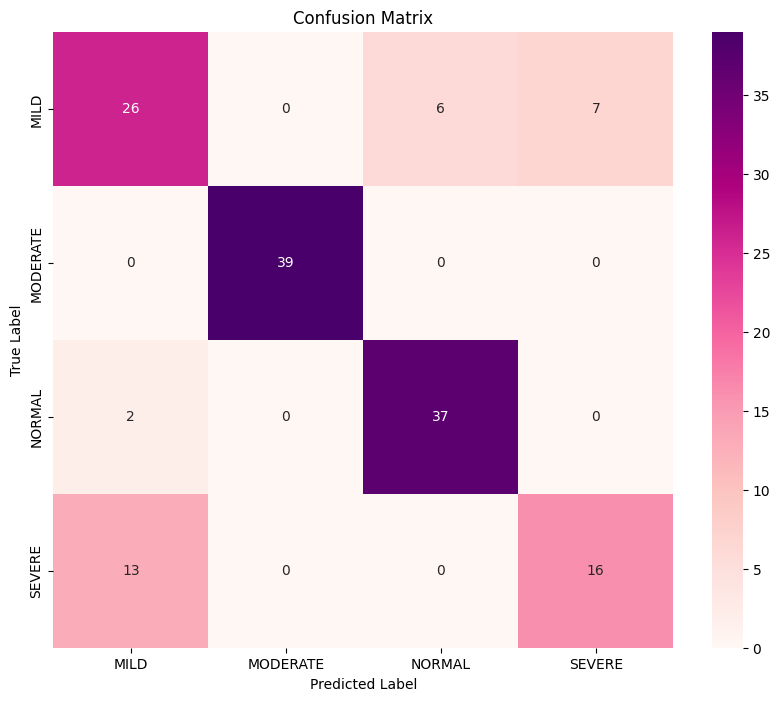

              precision    recall  f1-score   support

        MILD       0.63      0.67      0.65        39
    MODERATE       1.00      1.00      1.00        39
      NORMAL       0.86      0.95      0.90        39
      SEVERE       0.70      0.55      0.62        29

    accuracy                           0.81       146
   macro avg       0.80      0.79      0.79       146
weighted avg       0.80      0.81      0.80       146

MILD - Sensitivity (Recall): 0.6667, Specificity: 0.8598
MODERATE - Sensitivity (Recall): 1.0000, Specificity: 1.0000
NORMAL - Sensitivity (Recall): 0.9487, Specificity: 0.9439
SEVERE - Sensitivity (Recall): 0.5517, Specificity: 0.9402
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                 

In [3]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

# Data directories
train_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1"
val_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\VAL 1"
test_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TEST 1"

# Define ImageDataGenerator for preprocessing and augmentation
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0/255.0)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

# Load pre-trained model and modify the final layer for our task
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(len(train_generator.class_indices), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=val_generator,
    validation_steps=val_generator.samples // val_generator.batch_size,
    epochs=100
)

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(
    test_generator,
    steps=test_generator.samples // test_generator.batch_size
)

print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')

# Save MobileNetV2 model in h5 format
base_model.save('mobilenetv2_model.h5')

# Plot and save training history
plt.figure(figsize=(12, 8))

# Plot training & validation accuracy values
plt.subplot(2, 1, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(2, 1, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.savefig('training_history.png')
plt.show()

# Make predictions on the test data
predictions = model.predict(test_generator, steps=len(test_generator))
predicted_classes = tf.argmax(predictions, axis=1).numpy()

# Get true labels
true_classes = test_generator.classes[:len(predicted_classes)]
class_labels = list(test_generator.class_indices.keys())

# Compute confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Function to calculate sensitivity and specificity
def calculate_metrics(cm):
    num_classes = cm.shape[0]
    sensitivity = np.zeros(num_classes)
    specificity = np.zeros(num_classes)

    for i in range(num_classes):
        tp = cm[i, i]
        fn = np.sum(cm[i, :]) - tp
        fp = np.sum(cm[:, i]) - tp
        tn = np.sum(cm) - (tp + fn + fp)

        sensitivity[i] = tp / (tp + fn)
        specificity[i] = tn / (tn + fp)

    return sensitivity, specificity

# Calculate sensitivity and specificity
sensitivity, specificity = calculate_metrics(conf_matrix)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='RdPu', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.savefig('confusion_matrix.png')
plt.show()

# Classification report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Print sensitivity and specificity for each class
for i, class_name in enumerate(class_labels):
    print(f'{class_name} - Sensitivity (Recall): {sensitivity[i]:.4f}, Specificity: {specificity[i]:.4f}')

# Print the model summary again to show trainable and non-trainable parameters
model.summary()


MobileNetV2 EPOCH 50 BATCHSIZE 16

Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                   

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


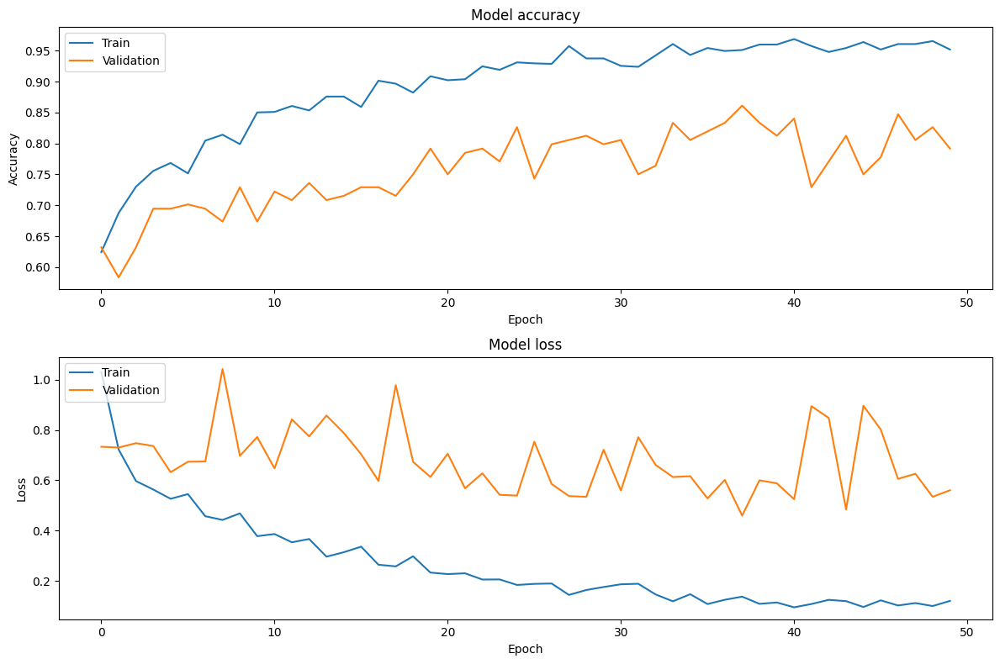

10/10 [==============================] - 5s 348ms/step


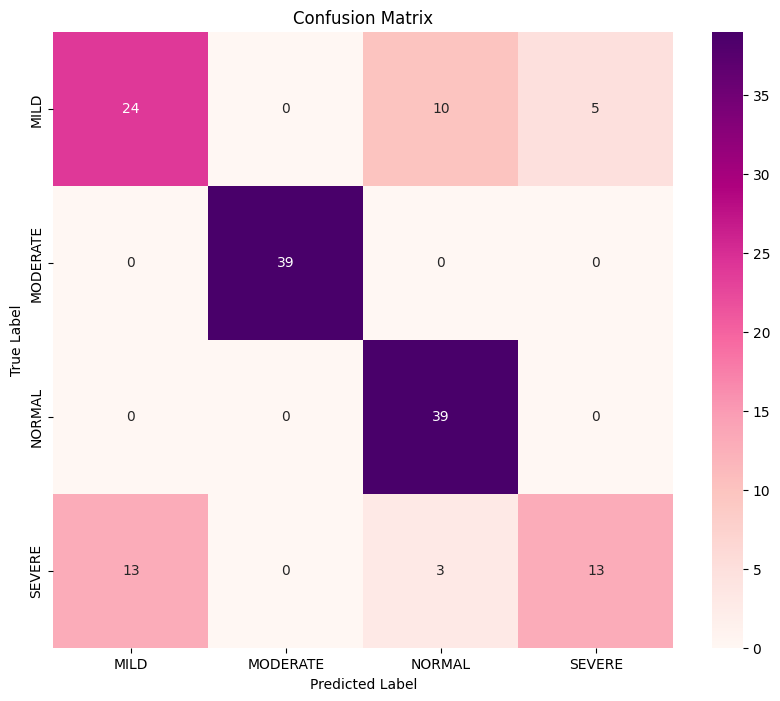

              precision    recall  f1-score   support

        MILD       0.65      0.62      0.63        39
    MODERATE       1.00      1.00      1.00        39
      NORMAL       0.75      1.00      0.86        39
      SEVERE       0.72      0.45      0.55        29

    accuracy                           0.79       146
   macro avg       0.78      0.77      0.76       146
weighted avg       0.78      0.79      0.77       146

MILD - Sensitivity (Recall): 0.6154, Specificity: 0.8785
MODERATE - Sensitivity (Recall): 1.0000, Specificity: 1.0000
NORMAL - Sensitivity (Recall): 1.0000, Specificity: 0.8785
SEVERE - Sensitivity (Recall): 0.4483, Specificity: 0.9573
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
               

In [4]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

# Data directories
train_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1"
val_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\VAL 1"
test_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TEST 1"

# Define ImageDataGenerator for preprocessing and augmentation
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0/255.0)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False
)

# Load pre-trained model and modify the final layer for our task
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(len(train_generator.class_indices), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    validation_data=val_generator,
    validation_steps=val_generator.samples // val_generator.batch_size,
    epochs=50
)

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(
    test_generator,
    steps=test_generator.samples // test_generator.batch_size
)

print(f'Test Loss: {test_loss:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')

# Save MobileNetV2 model in h5 format
base_model.save('mobilenetv2(1)_model.h5')

# Plot and save training history
plt.figure(figsize=(12, 8))

# Plot training & validation accuracy values
plt.subplot(2, 1, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(2, 1, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.savefig('training_history.png')
plt.show()

# Make predictions on the test data
predictions = model.predict(test_generator, steps=len(test_generator))
predicted_classes = tf.argmax(predictions, axis=1).numpy()

# Get true labels
true_classes = test_generator.classes[:len(predicted_classes)]
class_labels = list(test_generator.class_indices.keys())

# Compute confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Function to calculate sensitivity and specificity
def calculate_metrics(cm):
    num_classes = cm.shape[0]
    sensitivity = np.zeros(num_classes)
    specificity = np.zeros(num_classes)

    for i in range(num_classes):
        tp = cm[i, i]
        fn = np.sum(cm[i, :]) - tp
        fp = np.sum(cm[:, i]) - tp
        tn = np.sum(cm) - (tp + fn + fp)

        sensitivity[i] = tp / (tp + fn)
        specificity[i] = tn / (tn + fp)

    return sensitivity, specificity

# Calculate sensitivity and specificity
sensitivity, specificity = calculate_metrics(conf_matrix)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='RdPu', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.savefig('confusion_matrix.png')
plt.show()

# Classification report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Print sensitivity and specificity for each class
for i, class_name in enumerate(class_labels):
    print(f'{class_name} - Sensitivity (Recall): {sensitivity[i]:.4f}, Specificity: {specificity[i]:.4f}')

# Print the model summary again to show trainable and non-trainable parameters
model.summary()


5/5 [==============================] - 3s 540ms/step


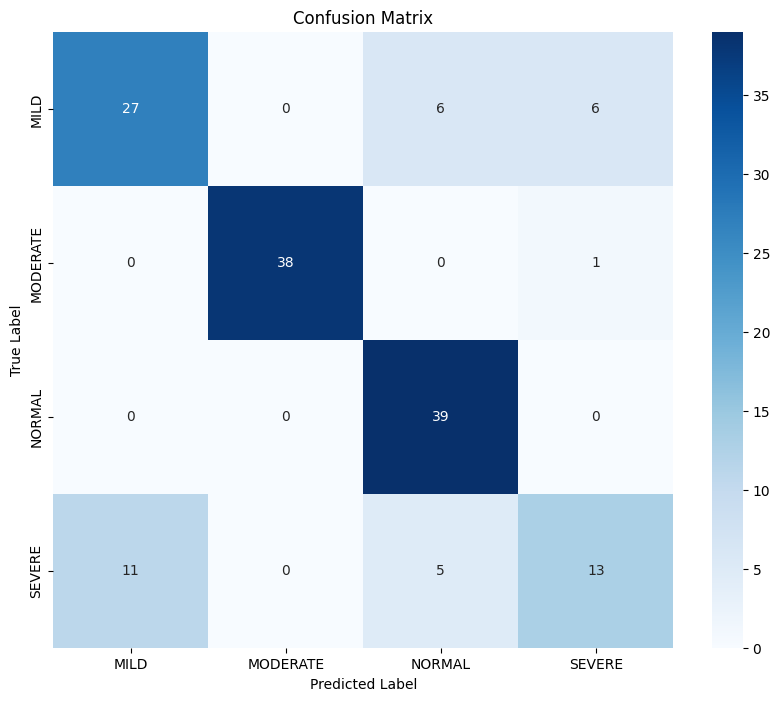

              precision    recall  f1-score   support

        MILD       0.71      0.69      0.70        39
    MODERATE       1.00      0.97      0.99        39
      NORMAL       0.78      1.00      0.88        39
      SEVERE       0.65      0.45      0.53        29

    accuracy                           0.80       146
   macro avg       0.79      0.78      0.77       146
weighted avg       0.79      0.80      0.79       146



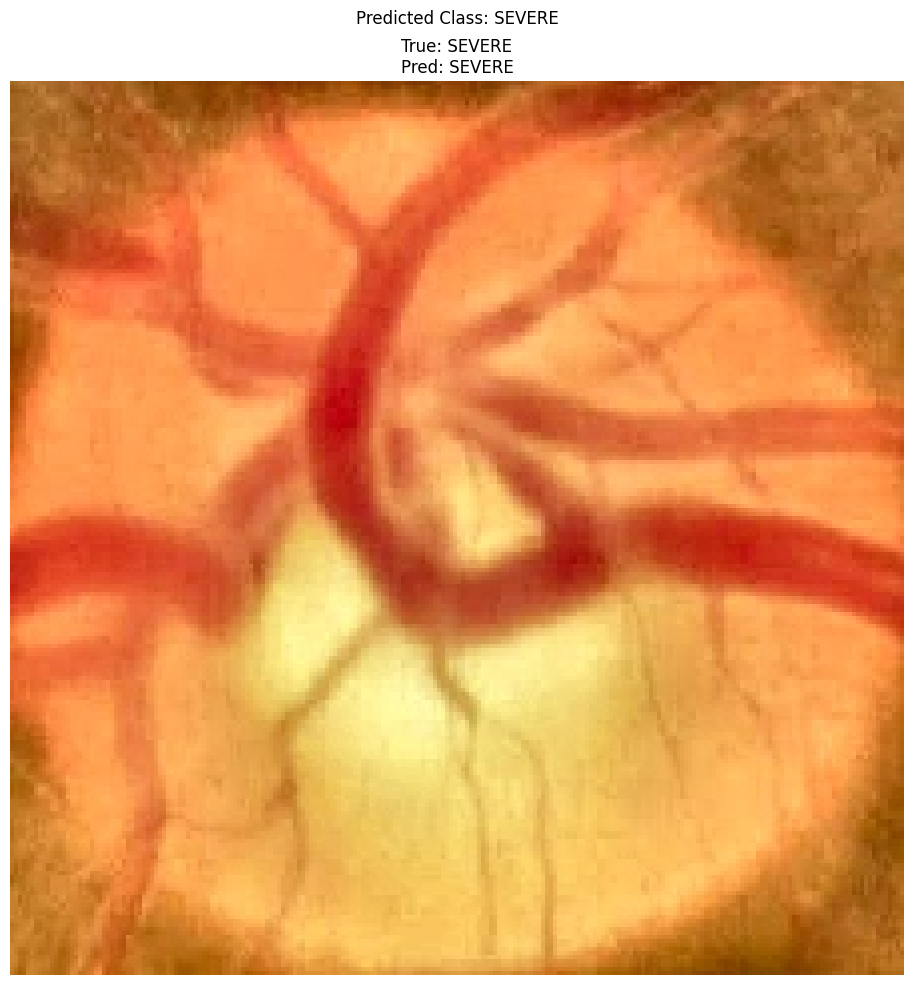

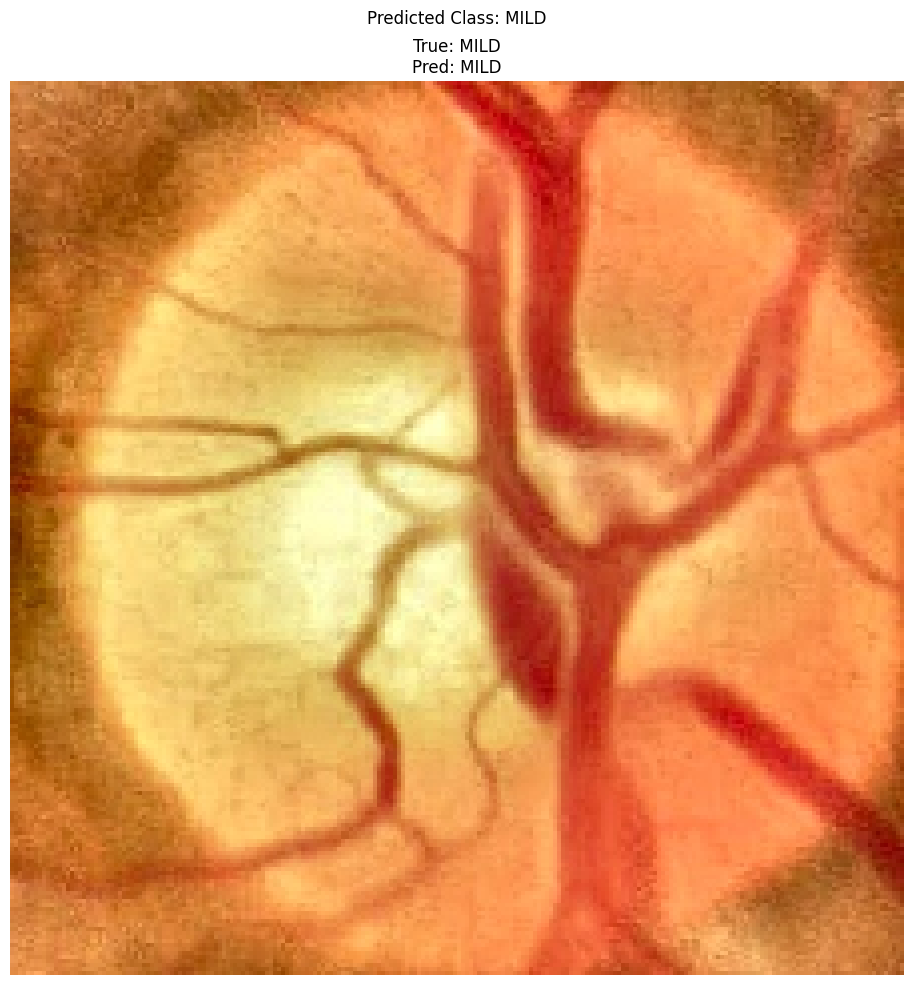

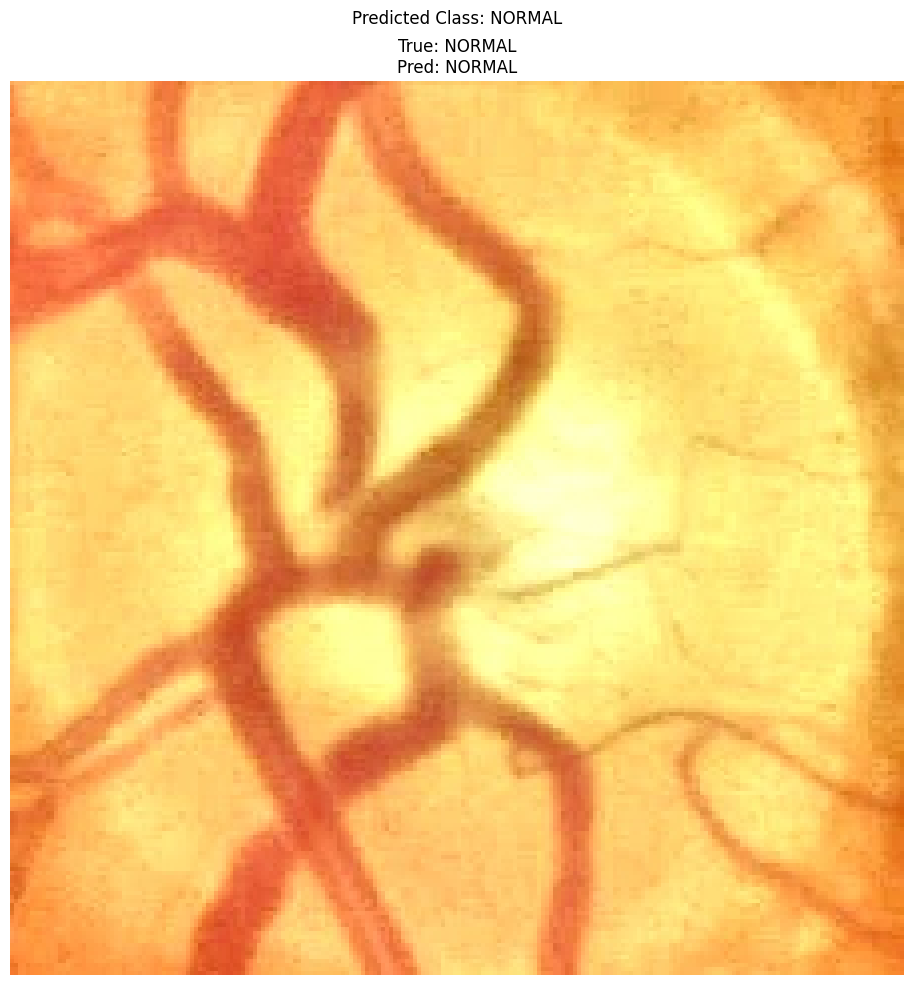

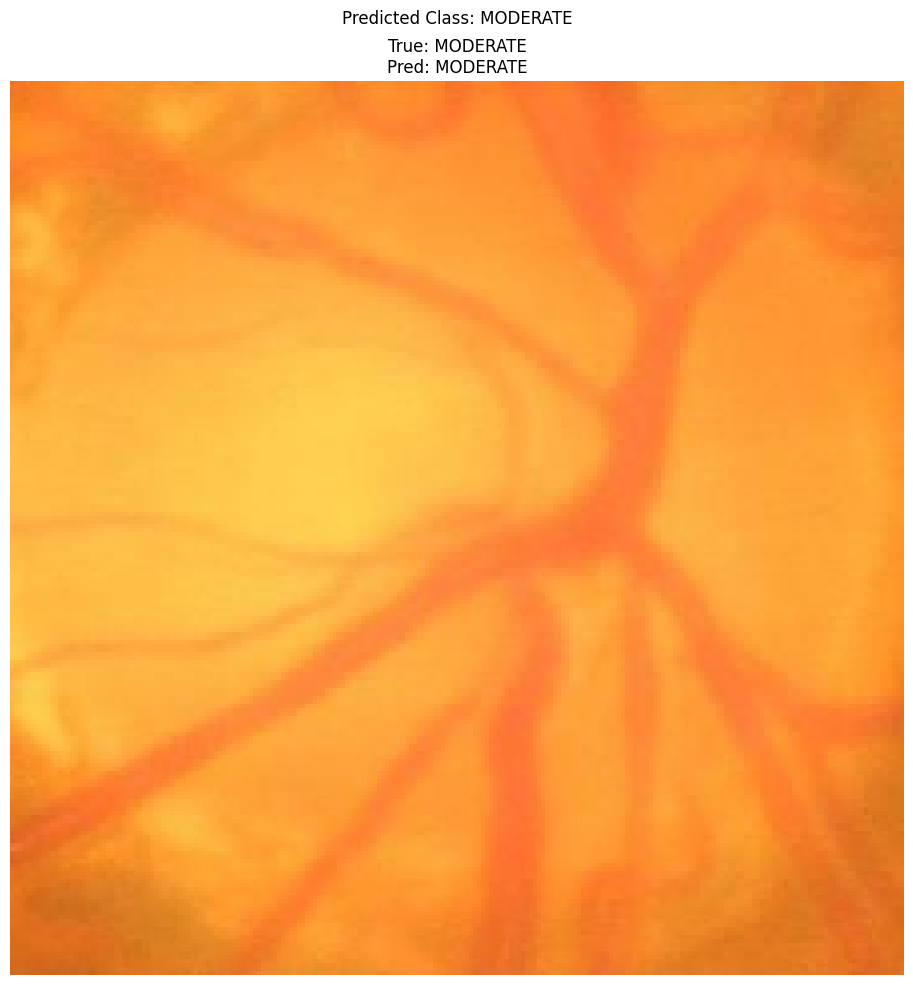

In [20]:
# Make predictions on the test data
predictions = model.predict(test_generator, steps=len(test_generator))
predicted_classes = tf.argmax(predictions, axis=1).numpy()

# Get true labels
true_classes = test_generator.classes[:len(predicted_classes)]
class_labels = list(test_generator.class_indices.keys())

# Compute confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.savefig('confusion_matrix.png')
plt.show()

# Classification report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))

# Function to plot random samples of images from specified predicted classes
def plot_random_samples(test_generator, true_classes, predicted_classes, class_labels, target_classes, num_samples=1):
    for target_class in target_classes:
        target_class_index = class_labels.index(target_class)
        indices = [i for i, pred in enumerate(predicted_classes) if pred == target_class_index]
        
        if len(indices) == 0:
            print(f"No samples found for predicted class: {target_class}")
            continue

        random_indices = random.sample(indices, min(num_samples, len(indices)))
        
        plt.figure(figsize=(15, 10))
        
        for i, idx in enumerate(random_indices):
            img_path = test_generator.filepaths[idx]
            img = load_img(img_path, target_size=(224, 224))
            true_label = class_labels[true_classes[idx]]
            pred_label = class_labels[predicted_classes[idx]]
            
            plt.subplot(1, num_samples, i + 1)
            plt.imshow(img)
            plt.title(f"True: {true_label}\nPred: {pred_label}")
            plt.axis('off')
        
        plt.suptitle(f"Predicted Class: {target_class}")
        plt.tight_layout()
        plt.show()

# Example usage
target_classes = ['SEVERE', 'MILD', 'NORMAL', 'MODERATE']
plot_random_samples(test_generator, true_classes, predicted_classes, class_labels, target_classes, num_samples=1)

CNN pre trained RESNET18

Number of samples in training set: 1248
Number of samples in testing set: 146
Number of samples in validation set: 156
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn

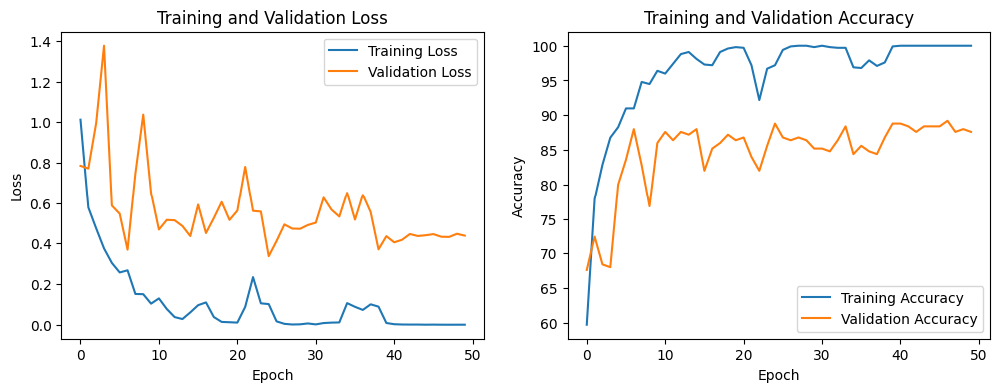

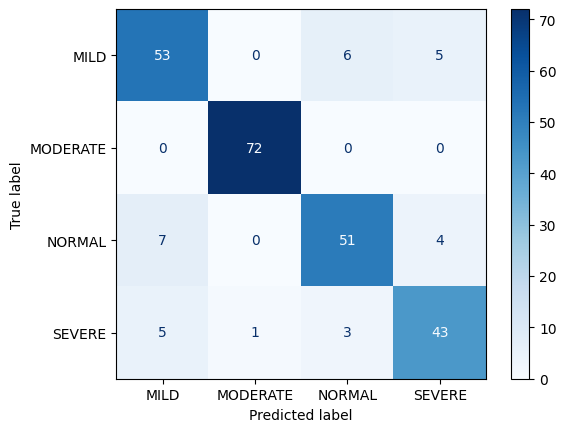


Classification Report:

              precision    recall  f1-score   support

        MILD       0.82      0.83      0.82        64
    MODERATE       0.99      1.00      0.99        72
      NORMAL       0.85      0.82      0.84        62
      SEVERE       0.83      0.83      0.83        52

    accuracy                           0.88       250
   macro avg       0.87      0.87      0.87       250
weighted avg       0.88      0.88      0.88       250

Model saved successfully.
Training complete


In [8]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

# Define transformations for the data
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Load dataset
train_dataset = datasets.ImageFolder(root=r'C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1', transform=transform)
test_dataset = datasets.ImageFolder(root=r'C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TEST 1', transform=transform)
val_dataset = datasets.ImageFolder(root=r'C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\VAL 1', transform=transform)

# Print dataset sizes
print(f"Number of samples in training set: {len(train_dataset)}")
print(f"Number of samples in testing set: {len(test_dataset)}")
print(f"Number of samples in validation set: {len(val_dataset)}")


# DataLoaders for training and testing sets
train_loader = DataLoader(train_data, batch_size=16, shuffle=True)
test_loader = DataLoader(test_data, batch_size=16, shuffle=False)

# Load pre-trained ResNet18 model
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features

# Modify the final fully connected layer to output 4 classes
model.fc = nn.Linear(num_ftrs, 4)

# Print model summary
print(model)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 50
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct_train = 0
    total_train = 0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_accuracy = 100 * correct_train / total_train
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)

    # Validation loop
    model.eval()
    correct = 0
    total = 0
    running_val_loss = 0.0
    all_labels = []
    all_preds = []
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

    val_loss = running_val_loss / len(test_loader)
    val_accuracy = 100 * correct / total
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%')

# Final accuracy calculation
final_accuracy = val_accuracies[-1]
print(f'Final Validation Accuracy: {final_accuracy:.2f}%')

# Plotting training and validation loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

# Plotting training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.show()

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=train_dataset.classes)
disp.plot(cmap=plt.cm.Blues)
plt.show()

# Classification Report
report = classification_report(all_labels, all_preds, target_names=train_dataset.classes)
print('\nClassification Report:\n')
print(report)

# Save the trained model
torch.save(model.state_dict(), 'resnet18_model.pth')
print("Model saved successfully.")

print('Training complete')


In [14]:
# Save the trained model
torch.save(model.state_dict(), 'resnet18 (1)_model.pth')
print("Model saved successfully.")

Model saved successfully.


Number of samples in the dataset: 1508
Number of samples in training set: 1206
Number of samples in validation set: 150
Number of samples in testing set: 152


c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

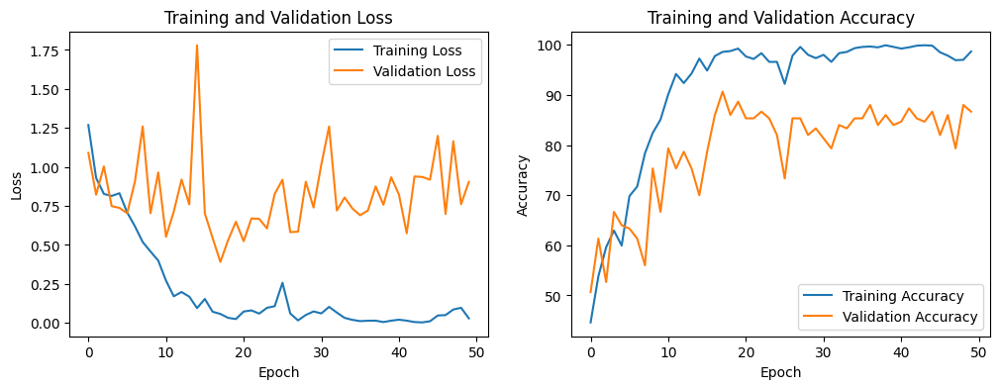

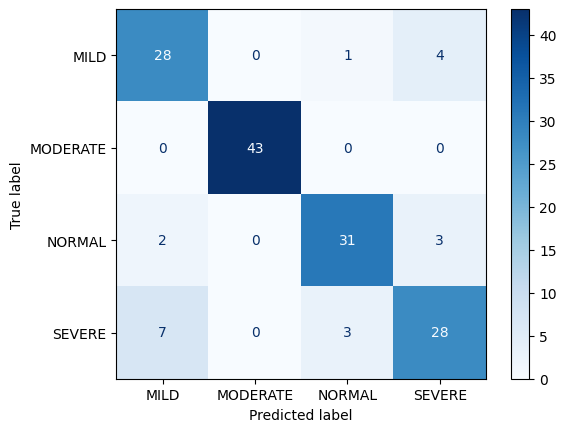


Classification Report:

              precision    recall  f1-score   support

        MILD       0.76      0.85      0.80        33
    MODERATE       1.00      1.00      1.00        43
      NORMAL       0.89      0.86      0.87        36
      SEVERE       0.80      0.74      0.77        38

    accuracy                           0.87       150
   macro avg       0.86      0.86      0.86       150
weighted avg       0.87      0.87      0.87       150

Training complete


In [12]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

# Define transformations for the data
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Main dataset path
main_dataset_path = r'C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\IMAGE CROP PREPRO'

# Load dataset
dataset = datasets.ImageFolder(root=main_dataset_path, transform=transform)

# Split dataset into training, validation, and testing sets (80-10-10 split)
train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size
train_data, val_data, test_data = random_split(dataset, [train_size, val_size, test_size])

# DataLoaders for training, validation, and testing sets
train_loader = DataLoader(train_data, batch_size=16, shuffle=True)
val_loader = DataLoader(val_data, batch_size=16, shuffle=False)
test_loader = DataLoader(test_data, batch_size=16, shuffle=False)

# Print dataset sizes
print(f"Number of samples in the dataset: {len(dataset)}")
print(f"Number of samples in training set: {len(train_data)}")
print(f"Number of samples in validation set: {len(val_data)}")
print(f"Number of samples in testing set: {len(test_data)}")

# Load pre-trained ResNet18 model
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features

# Modify the final fully connected layer to output 4 classes
model.fc = nn.Linear(num_ftrs, 4)

# Print model summary
print(model)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 50
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct_train = 0
    total_train = 0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_accuracy = 100 * correct_train / total_train
    train_losses.append(train_loss)
    train_accuracies.append(train_accuracy)

    # Validation loop
    model.eval()
    correct = 0
    total = 0
    running_val_loss = 0.0
    all_labels = []
    all_preds = []
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            running_val_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

    val_loss = running_val_loss / len(val_loader)
    val_accuracy = 100 * correct / total
    val_losses.append(val_loss)
    val_accuracies.append(val_accuracy)

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.2f}%, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%')

# Final accuracy calculation
final_accuracy = val_accuracies[-1]
print(f'Final Validation Accuracy: {final_accuracy:.2f}%')

# Plotting training and validation loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

# Plotting training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.show()

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=dataset.classes)
disp.plot(cmap=plt.cm.Blues)
plt.show()

# Classification Report
report = classification_report(all_labels, all_preds, target_names=dataset.classes)
print('\nClassification Report:\n')
print(report)

# Save the trained model
#torch.save(model.state_dict(), 'resnet18_model.pth')
#print("Model saved successfully.")

print('Training complete')


In [13]:
# Save the trained model
torch.save(model.state_dict(), 'resnet18_model.pth')
print("Model saved successfully.")

Model saved successfully.


RESNET50

Number of samples in the dataset: 1550
Number of samples in training set: 1248
Number of samples in validation set: 156
Number of samples in testing set: 146


c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

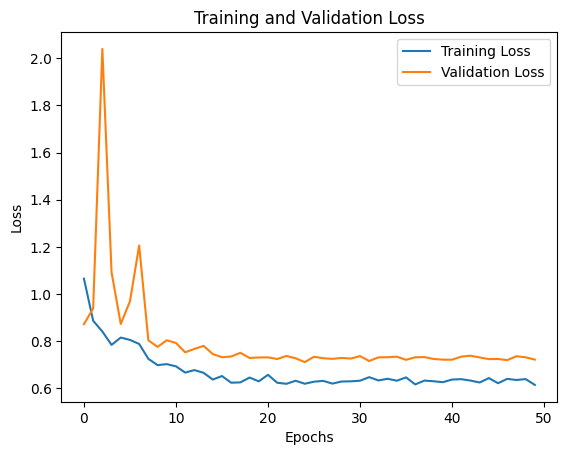

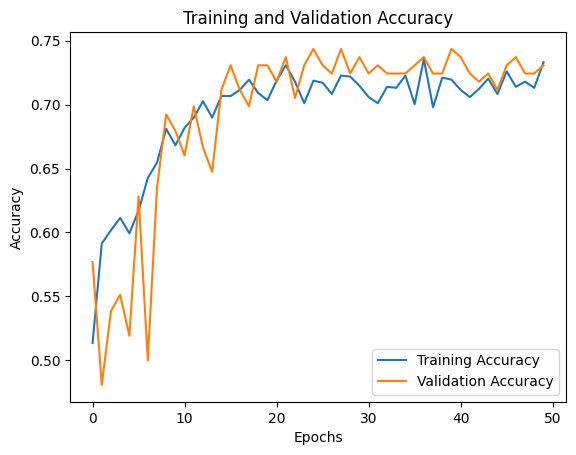

Test Loss: 0.7047 Acc: 0.6507


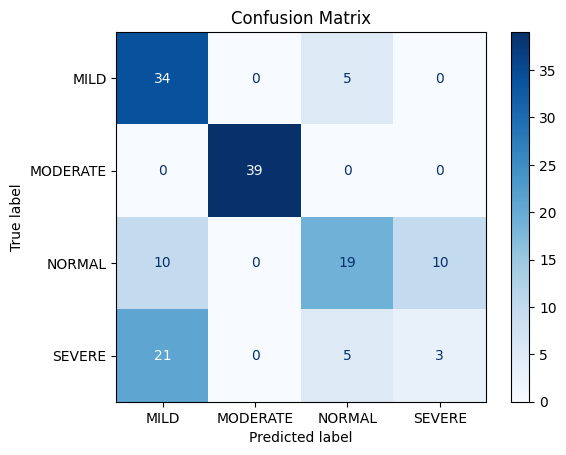

In [6]:
import os
import copy
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np
from torchsummary import summary

# Setup
data_dir = r'C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii'
train_dir = os.path.join(data_dir, 'TRAIN 1')
val_dir = os.path.join(data_dir, 'VAL 1')
test_dir = os.path.join(data_dir, 'TEST 1')
num_classes = 4
batch_size = 16
num_epochs = 50
learning_rate = 0.001

# Data augmentation and normalization for training
# Just normalization for validation and testing
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),  # Ubah ukuran menjadi 224x224 sesuai input ResNet50
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

# Load datasets
image_datasets = {
    'train': datasets.ImageFolder(root=train_dir, transform=data_transforms['train']),
    'val': datasets.ImageFolder(root=val_dir, transform=data_transforms['val']),
    'test': datasets.ImageFolder(root=test_dir, transform=data_transforms['test'])
}
dataloaders = {
    'train': DataLoader(image_datasets['train'], batch_size=batch_size, shuffle=True, num_workers=4),
    'val': DataLoader(image_datasets['val'], batch_size=batch_size, shuffle=False, num_workers=4),
    'test': DataLoader(image_datasets['test'], batch_size=batch_size, shuffle=False, num_workers=4)
}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val', 'test']}
class_names = image_datasets['train'].classes

# Print dataset sizes
print(f"Number of samples in the dataset: {len(image_datasets['train']) + len(image_datasets['val']) + len(image_datasets['test'])}")
print(f"Number of samples in training set: {len(image_datasets['train'])}")
print(f"Number of samples in validation set: {len(image_datasets['val'])}")
print(f"Number of samples in testing set: {len(image_datasets['test'])}")

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load pre-trained model and modify the final layer
model_ft = models.resnet50(pretrained=True)
num_ftrs = model_ft.fc.in_features
model_ft.fc = nn.Linear(num_ftrs, num_classes)

model_ft = model_ft.to(device)

# Print model summary
summary(model_ft, (3, 224, 224))

criterion = nn.CrossEntropyLoss()

# Use Adam optimizer
optimizer_ft = optim.Adam(model_ft.parameters(), lr=learning_rate)

# Optional: StepLR scheduler can still be used if needed
scheduler = optim.lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

# Training the model with added tracking of loss and accuracy
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    train_loss_history = []
    val_loss_history = []
    train_acc_history = []
    val_acc_history = []

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'train':
                train_loss_history.append(epoch_loss)
                train_acc_history.append(epoch_acc)
            else:
                val_loss_history.append(epoch_loss)
                val_acc_history.append(epoch_acc)

            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    model.load_state_dict(best_model_wts)
    
    # Plot training and validation loss and accuracy
    plt.figure()
    plt.plot(train_loss_history, label='Training Loss')
    plt.plot(val_loss_history, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss')
    plt.show()

    plt.figure()
    plt.plot(train_acc_history, label='Training Accuracy')
    plt.plot(val_acc_history, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Training and Validation Accuracy')
    plt.show()

    return model

# Run the training and save the best model
model_ft = train_model(model_ft, criterion, optimizer_ft, scheduler, num_epochs=num_epochs)
torch.save(model_ft.state_dict(), 'best_model.pth')

# Evaluate the model on the test set and plot confusion matrix
def evaluate_model(model, dataloader, criterion):
    model.eval()
    running_loss = 0.0
    running_corrects = 0

    all_preds = []
    all_labels = []

    for inputs, labels in dataloader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        with torch.no_grad():
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    test_loss = running_loss / len(dataloader.dataset)
    test_acc = running_corrects.double() / len(dataloader.dataset)
    print(f'Test Loss: {test_loss:.4f} Acc: {test_acc:.4f}')

    return all_labels, all_preds

# Load the best model and evaluate on the test set
model_ft.load_state_dict(torch.load('best_model.pth'))
all_labels, all_preds = evaluate_model(model_ft, dataloaders['test'], criterion)

# Plot confusion matrix
cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()


In [7]:
# Generate the classification report
report = classification_report(all_labels, all_preds, target_names=class_names)
print("Classification Report:\n")
print(report)

Classification Report:

              precision    recall  f1-score   support

        MILD       0.52      0.87      0.65        39
    MODERATE       1.00      1.00      1.00        39
      NORMAL       0.66      0.49      0.56        39
      SEVERE       0.23      0.10      0.14        29

    accuracy                           0.65       146
   macro avg       0.60      0.62      0.59       146
weighted avg       0.63      0.65      0.62       146



In [36]:
import os
import copy
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np
from torchsummary import summary

# Setup
data_dir = r'C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii'
train_dir = os.path.join(data_dir, 'TRAIN 1')
val_dir = os.path.join(data_dir, 'VAL 1')
test_dir = os.path.join(data_dir, 'TEST 1')
num_classes = 4
batch_size = 16
num_epochs = 100
learning_rate = 0.001

# Data augmentation and normalization for training
# Just normalization for validation and testing
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),  # Ubah ukuran menjadi 224x224 sesuai input ResNet50
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

# Load datasets
image_datasets = {
    'train': datasets.ImageFolder(root=train_dir, transform=data_transforms['train']),
    'val': datasets.ImageFolder(root=val_dir, transform=data_transforms['val']),
    'test': datasets.ImageFolder(root=test_dir, transform=data_transforms['test'])
}
dataloaders = {
    'train': DataLoader(image_datasets['train'], batch_size=batch_size, shuffle=True, num_workers=4),
    'val': DataLoader(image_datasets['val'], batch_size=batch_size, shuffle=False, num_workers=4),
    'test': DataLoader(image_datasets['test'], batch_size=batch_size, shuffle=False, num_workers=4)
}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val', 'test']}
class_names = image_datasets['train'].classes

# Print dataset sizes
print(f"Number of samples in the dataset: {len(image_datasets['train']) + len(image_datasets['val']) + len(image_datasets['test'])}")
print(f"Number of samples in training set: {len(image_datasets['train'])}")
print(f"Number of samples in validation set: {len(image_datasets['val'])}")
print(f"Number of samples in testing set: {len(image_datasets['test'])}")

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load pre-trained model and modify the final layer
model_ft = models.resnet50(pretrained=True)
num_ftrs = model_ft.fc.in_features
model_ft.fc = nn.Linear(num_ftrs, num_classes)

model_ft = model_ft.to(device)

# Print model summary
summary(model_ft, (3, 224, 224))

criterion = nn.CrossEntropyLoss()

# Use Adam optimizer
optimizer_ft = optim.Adam(model_ft.parameters(), lr=learning_rate)

# Optional: StepLR scheduler can still be used if needed
scheduler = optim.lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

# Training the model with added tracking of loss and accuracy
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    train_loss_history = []
    val_loss_history = []
    train_acc_history = []
    val_acc_history = []

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'train':
                train_loss_history.append(epoch_loss)
                train_acc_history.append(epoch_acc)
            else:
                val_loss_history.append(epoch_loss)
                val_acc_history.append(epoch_acc)

            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    model.load_state_dict(best_model_wts)
    
    # Plot training and validation loss and accuracy
    plt.figure()
    plt.plot(train_loss_history, label='Training Loss')
    plt.plot(val_loss_history, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss')
    plt.show()

    plt.figure()
    plt.plot(train_acc_history, label='Training Accuracy')
    plt.plot(val_acc_history, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Training and Validation Accuracy')
    plt.show()

    return model

# Run the training and save the best model
model_ft = train_model(model_ft, criterion, optimizer_ft, scheduler, num_epochs=num_epochs)
torch.save(model_ft.state_dict(), 'best_model.pth')

# Evaluate the model on the test set and plot confusion matrix
def evaluate_model(model, dataloader, criterion):
    model.eval()
    running_loss = 0.0
    running_corrects = 0

    all_preds = []
    all_labels = []

    for inputs, labels in dataloader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        with torch.no_grad():
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    test_loss = running_loss / len(dataloader.dataset)
    test_acc = running_corrects.double() / len(dataloader.dataset)
    print(f'Test Loss: {test_loss:.4f} Acc: {test_acc:.4f}')

    return all_labels, all_preds

# Load the best model and evaluate on the test set
model_ft.load_state_dict(torch.load('best_model.pth'))
all_labels, all_preds = evaluate_model(model_ft, dataloaders['test'], criterion)

# Plot confusion matrix
cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

Number of samples in the dataset: 1550
Number of samples in training set: 1248
Number of samples in validation set: 156
Number of samples in testing set: 146


c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]           4,096
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          16,384
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

KeyboardInterrupt: 

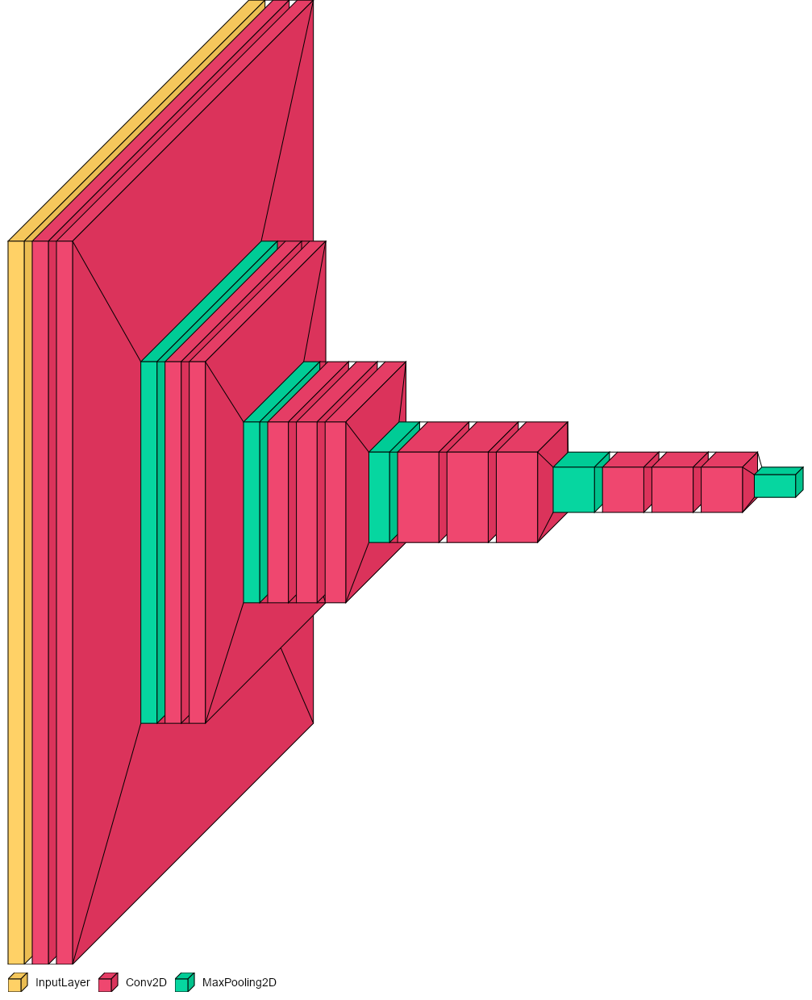

In [23]:
import os
from keras.applications import VGG16
import visualkeras
from PIL import ImageFont

# Pastikan direktori images ada
if not os.path.exists('images'):
    os.makedirs('images')

# Load the VGG16 model without the top layer and with the desired input shape
model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Define a font
try:
    font = ImageFont.truetype("arial.ttf", 14)
except IOError:
    font = ImageFont.load_default()

# Patch the visualkeras to use getbbox instead of getsize
def patched_getsize(self, text):
    return self.getbbox(text)[2:]

ImageFont.FreeTypeFont.getsize = patched_getsize

# Visualize the model architecture
visualkeras.layered_view(model, legend=True, to_file='images/VGG16.png', font=font)





VGG16 100 epoch

Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/100
39/39 [==============================] - 753s 19s/step - loss: 1.1349 - accuracy: 0.4567 - val_loss: 0.9359 - val_accuracy: 0.5385
Epoch 2/100
39/39 [==============================] - 3356s 88s/step - loss: 0.9769 - accuracy: 0.5337 - val_loss: 0.9399 - val_accuracy: 0.5897
Epoch 3/100
39/39 [==============================] - 934s 24s/step - loss: 0.9149 - accuracy: 0.5481 - val_loss: 0.8448 - val_accuracy: 0.6410
Epoch 4/100
39/39 [==============================] - 783s 20s/step - loss: 0.8678 - accuracy: 0.6066 - val_loss: 0.8046 - val_accuracy: 0.5833
Epoch 5/100
39/39 [==============================] - 506s 13s/step - loss: 0.8293 - accuracy: 0.6154 - val_loss: 0.7728 - val_accuracy: 0.6987
Epoch 6/100
39/39 [==============================] - 520s 13s/step - loss: 0.7815 - accuracy: 0.6458 - val_loss: 0.7011 - val_accuracy: 0.7051
Epoch 7/100
39/39

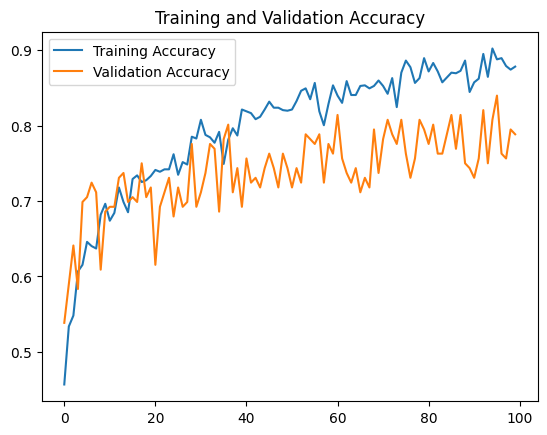

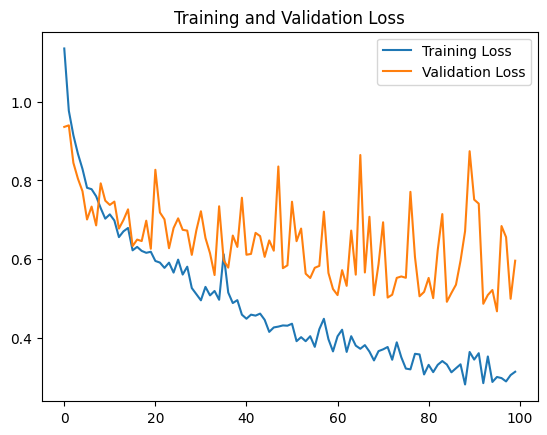

5/5 [==============================] - 55s 11s/step - loss: 0.6955 - accuracy: 0.7740
Test Loss: 0.6955 Test Accuracy: 0.7740
5/5 [==============================] - 58s 11s/step
Confusion Matrix:
 [[37  0  2  0]
 [ 1 38  0  0]
 [15  0 19  5]
 [ 9  0  1 19]]
Classification Report:
               precision    recall  f1-score   support

        MILD       0.60      0.95      0.73        39
    MODERATE       1.00      0.97      0.99        39
      NORMAL       0.86      0.49      0.62        39
      SEVERE       0.79      0.66      0.72        29

    accuracy                           0.77       146
   macro avg       0.81      0.77      0.76       146
weighted avg       0.81      0.77      0.77       146



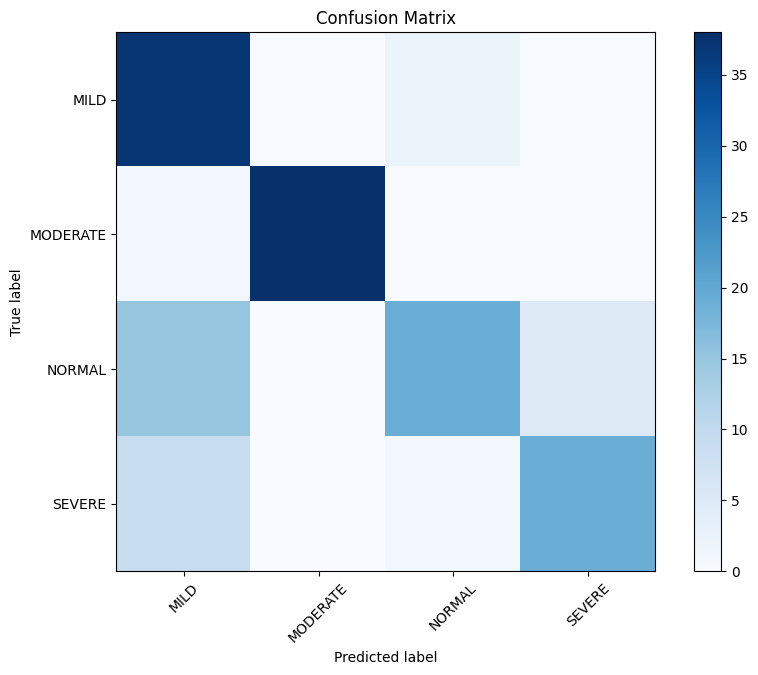

In [23]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt

# Data directories
train_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1"
val_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\VAL 1"
test_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TEST 1"

num_classes = 4
batch_size = 16
num_epochs = 100
learning_rate = 0.001
input_shape = (224, 224, 3)  # Modified input shape

# Data augmentation and normalization
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,  # Modified batch size
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,  # Modified batch size
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,  # Modified batch size
    class_mode='categorical',
    shuffle=False
)

# Load pre-trained VGG16 model and modify the final layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    epochs=num_epochs,
    validation_data=val_generator
)

# Plot training and validation loss and accuracy
def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(len(acc))

    plt.figure()
    plt.plot(epochs, acc, label='Training Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.figure()
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

plot_history(history)

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(test_generator)
print(f'Test Loss: {test_loss:.4f} Test Accuracy: {test_acc:.4f}')

# Predict on the test set
test_generator.reset()
preds = model.predict(test_generator)
pred_labels = np.argmax(preds, axis=1)
true_labels = test_generator.classes

# Generate confusion matrix and classification report
cm = confusion_matrix(true_labels, pred_labels)
report = classification_report(true_labels, pred_labels, target_names=test_generator.class_indices.keys())

print("Confusion Matrix:\n", cm)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(test_generator.class_indices))
plt.xticks(tick_marks, test_generator.class_indices.keys(), rotation=45)
plt.yticks(tick_marks, test_generator.class_indices.keys())
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()





In [24]:
# Save the model
model.save("my_model.h5")
print("Model saved successfully.")

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model saved successfully.


In [5]:
import numpy as np
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
from PIL import Image

# Load the VGG16 model without the top layers
base_model = VGG16(weights='imagenet', include_top=False)

# Choose the layers from which you want to extract feature maps
layer_names = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
layers_output = [base_model.get_layer(name).output for name in layer_names]

# Create a new model that will output the feature maps from the chosen layers
feature_map_model = Model(inputs=base_model.input, outputs=layers_output)

# Function to load and preprocess the image
def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    return img_array

# Function to extract feature maps
def extract_feature_maps(img_array):
    feature_maps = feature_map_model.predict(img_array)
    return feature_maps

# Example usage
img_path = r'C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1\NORMAL\018_aug_0.jpg'
img_array = load_and_preprocess_image(img_path)
feature_maps = extract_feature_maps(img_array)

# Print the shapes of the feature maps
for fmap in feature_maps:
    print(fmap.shape)


1/1 [==============================] - 0s 500ms/step
(1, 224, 224, 64)
(1, 112, 112, 128)
(1, 56, 56, 256)
(1, 28, 28, 512)
(1, 14, 14, 512)


1/1 [==============================] - 1s 745ms/step


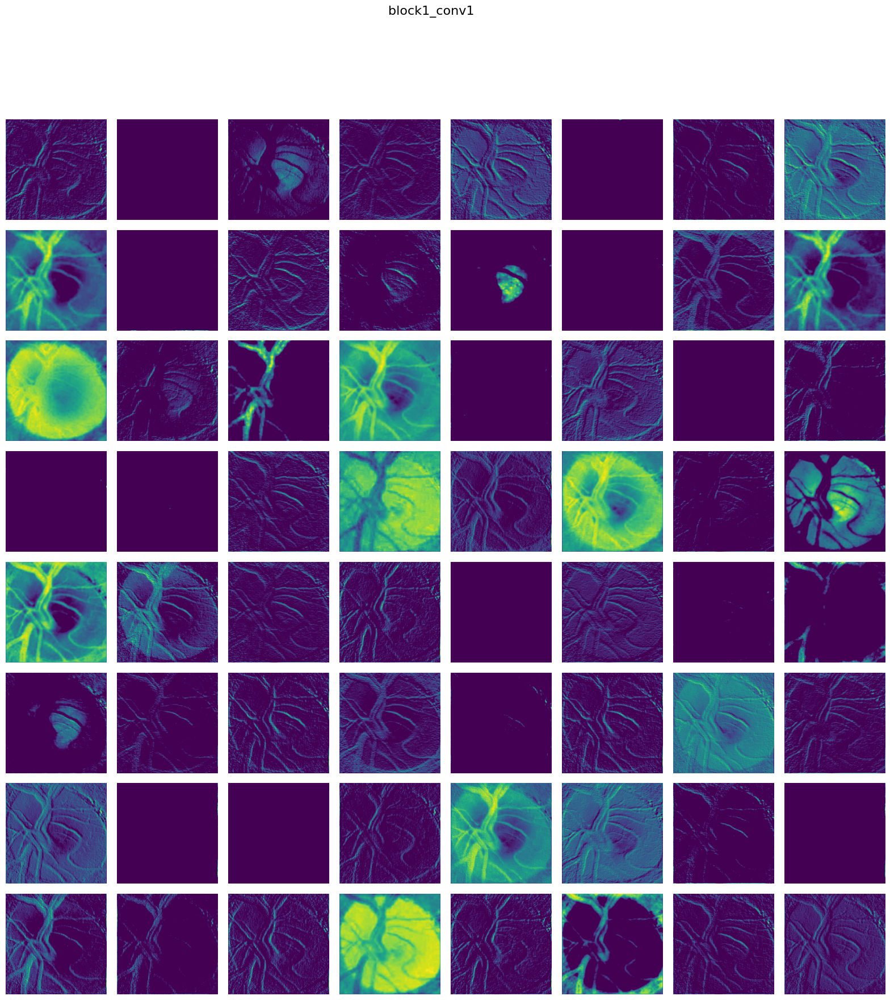

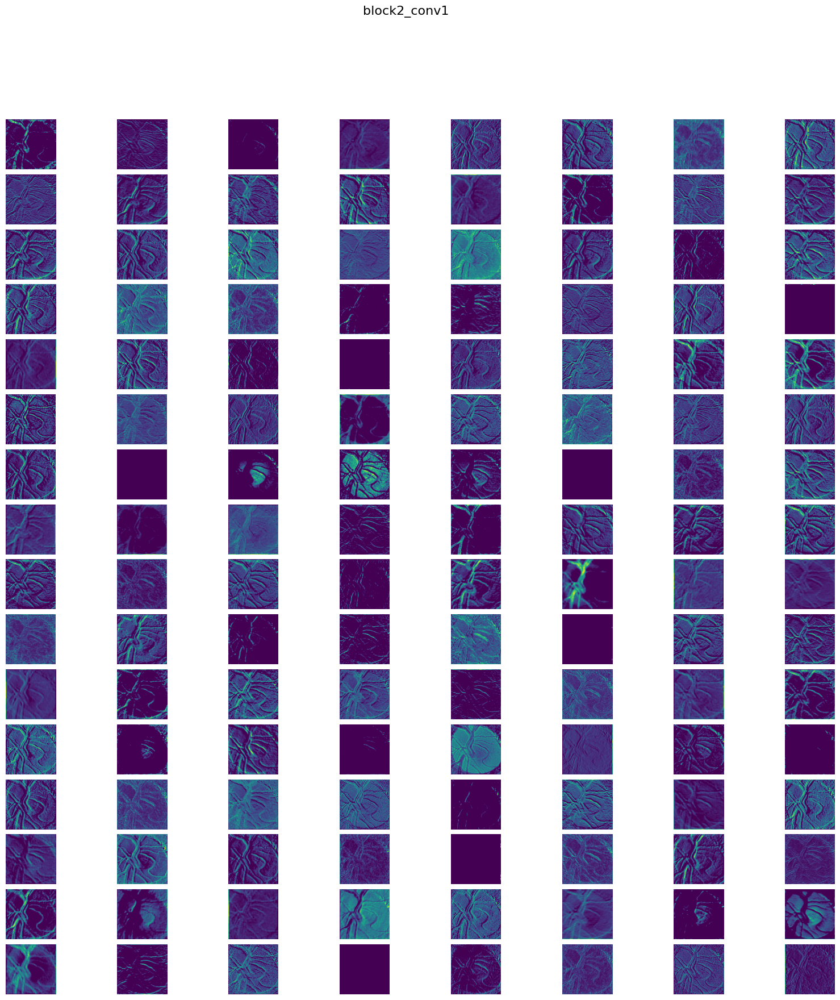

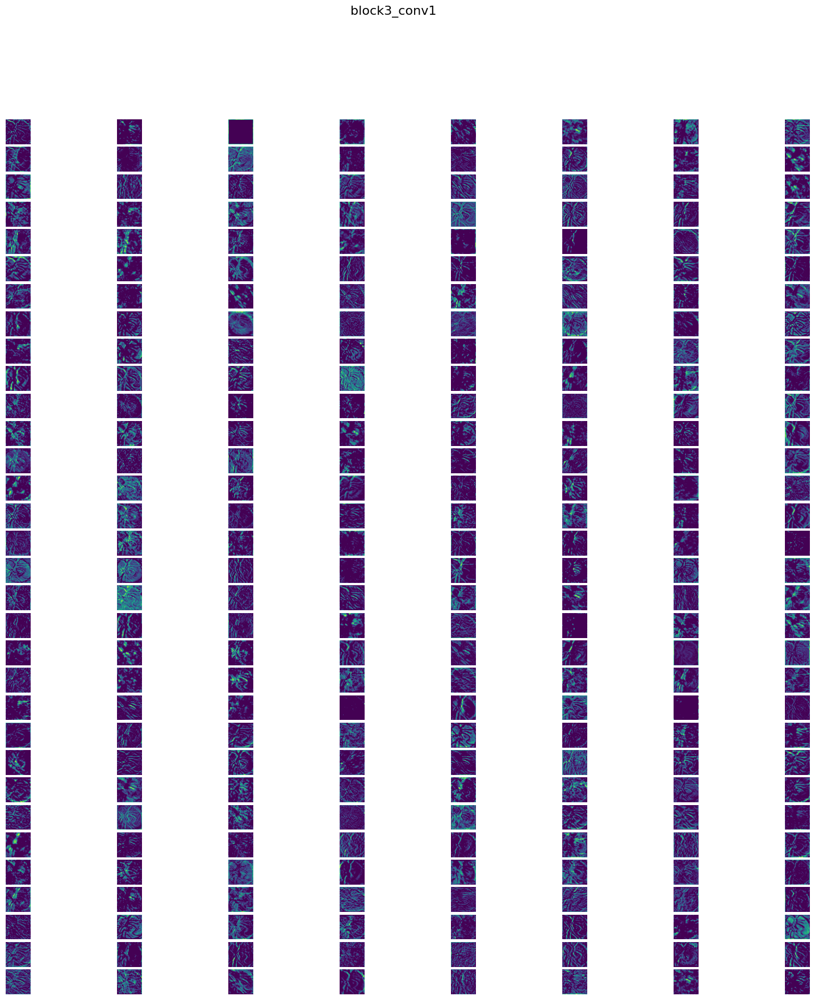

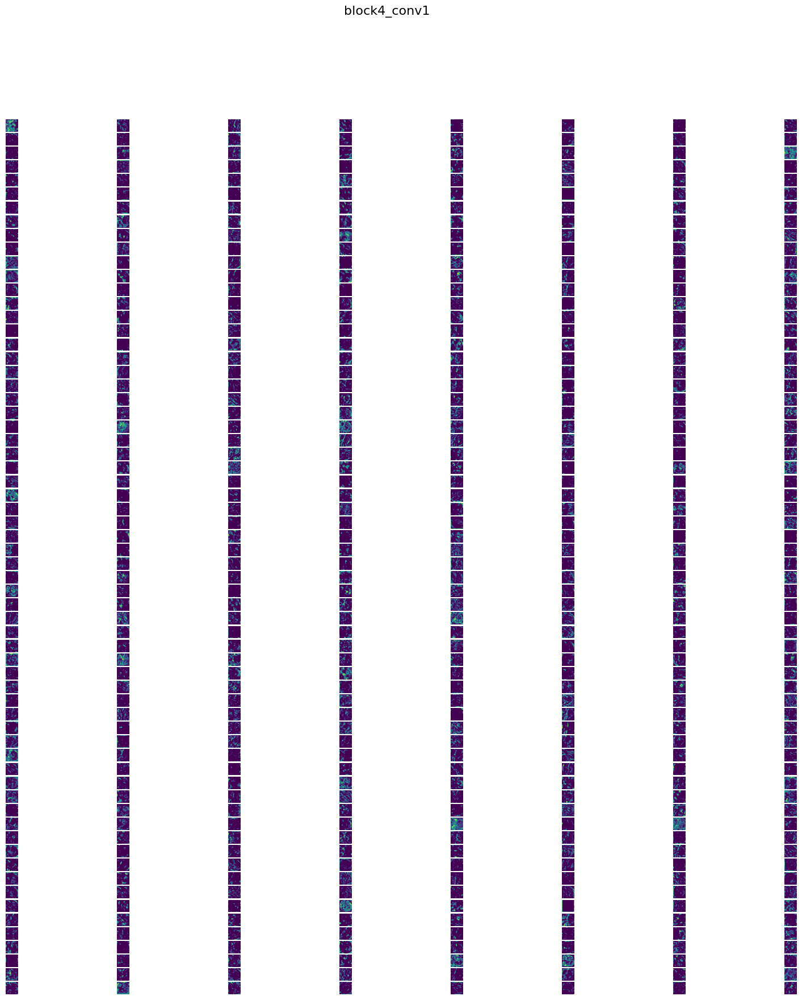

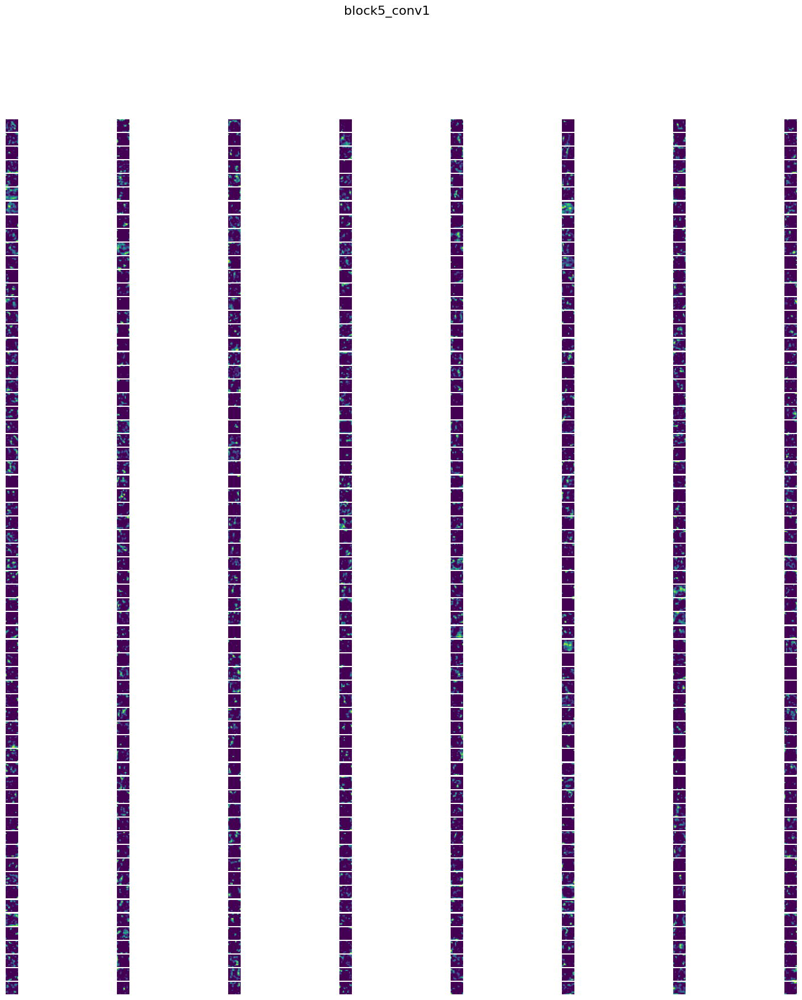

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input

# Load the VGG16 model without the top layers
base_model = VGG16(weights='imagenet', include_top=False)

# Choose the layers from which you want to extract feature maps
layer_names = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
layers_output = [base_model.get_layer(name).output for name in layer_names]

# Create a new model that will output the feature maps from the chosen layers
feature_map_model = Model(inputs=base_model.input, outputs=layers_output)

# Function to load and preprocess the image
def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    return img_array

# Function to extract feature maps
def extract_feature_maps(img_array):
    feature_maps = feature_map_model.predict(img_array)
    return feature_maps

# Function to visualize feature maps with 'viridis' colormap
def visualize_feature_maps_viridis(feature_maps, layer_names):
    for fmap, layer_name in zip(feature_maps, layer_names):
        num_feature_maps = fmap.shape[-1]
        size = fmap.shape[1]
        cols = 8  # Number of columns for subplot grid
        rows = num_feature_maps // cols + (num_feature_maps % cols > 0)
        
        fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
        fig.suptitle(layer_name, fontsize=16)

        for i in range(num_feature_maps):
            row = i // cols
            col = i % cols
            ax = axes[row, col]
            ax.axis('off')
            ax.imshow(fmap[0, :, :, i], cmap='viridis')

        for i in range(num_feature_maps, rows * cols):
            row = i // cols
            col = i % cols
            axes[row, col].axis('off')

        plt.subplots_adjust(wspace=0.1, hspace=0.1)
        plt.show()

# Example usage
img_path = r'C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1\NORMAL\018_aug_0.jpg'
img_array = load_and_preprocess_image(img_path)
feature_maps = extract_feature_maps(img_array)

# Visualize the feature maps with 'viridis' colormap
visualize_feature_maps_viridis(feature_maps, layer_names)


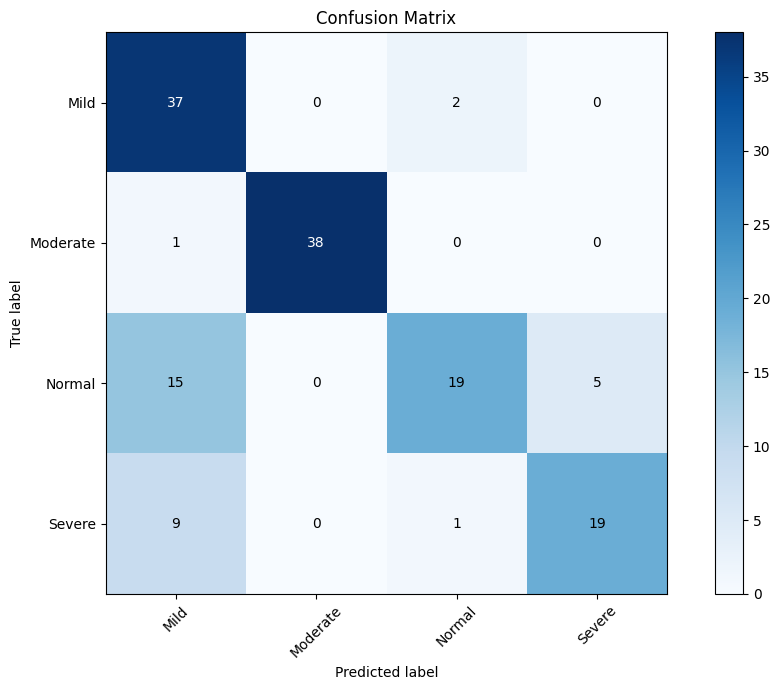

In [26]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt

# Data directories
train_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1"
val_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\VAL 1"
test_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TEST 1"

num_classes = 4
batch_size = 16
num_epochs = 100
learning_rate = 0.001
input_shape = (224, 224, 3)  # Modified input shape

# Data augmentation and normalization
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,  # Modified batch size
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,  # Modified batch size
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,  # Modified batch size
    class_mode='categorical',
    shuffle=False
)

# Load pre-trained VGG16 model and modify the final layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    epochs=num_epochs,
    validation_data=val_generator
)

# Plot training and validation loss and accuracy
def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(len(acc))

    plt.figure()
    plt.plot(epochs, acc, label='Training Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.figure()
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

plot_history(history)

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(test_generator)
print(f'Test Loss: {test_loss:.4f} Test Accuracy: {test_acc:.4f}')

# Predict on the test set
test_generator.reset()
preds = model.predict(test_generator)
pred_labels = np.argmax(preds, axis=1)
true_labels = test_generator.classes

# Generate confusion matrix and classification report
cm = confusion_matrix(true_labels, pred_labels)
report = classification_report(true_labels, pred_labels, target_names=test_generator.class_indices.keys())

print("Confusion Matrix:\n", cm)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(test_generator.class_indices))
plt.xticks(tick_marks, test_generator.class_indices.keys(), rotation=45)
plt.yticks(tick_marks, test_generator.class_indices.keys())
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()
# Example confusion matrix
cm = np.array([[37,  0,  2,  0],
               [ 1, 38,  0,  0],
               [15,  0, 19,  5],
               [ 9,  0,  1, 19]])

# Define class names (replace these with actual class names)
class_names = ['Mild', 'Moderate', 'Normal', 'Severe']

# Plot confusion matrix
plt.figure(figsize=(10, 7))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

thresh = cm.max() / 2.0  # Midpoint value to determine text color

# Add text inside each cell
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 ha="center", va="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.tight_layout()
plt.show()


VGG 16 175 epoch

Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/175
39/39 [==============================] - 593s 15s/step - loss: 1.1522 - accuracy: 0.4423 - val_loss: 0.9185 - val_accuracy: 0.6154
Epoch 2/175
39/39 [==============================] - 661s 17s/step - loss: 0.9734 - accuracy: 0.5433 - val_loss: 0.8698 - val_accuracy: 0.6026
Epoch 3/175
39/39 [==============================] - 470s 12s/step - loss: 0.9090 - accuracy: 0.5689 - val_loss: 0.9048 - val_accuracy: 0.6218
Epoch 4/175
39/39 [==============================] - 516s 13s/step - loss: 0.8493 - accuracy: 0.6202 - val_loss: 0.7814 - val_accuracy: 0.5962
Epoch 5/175
39/39 [==============================] - 393s 10s/step - loss: 0.8025 - accuracy: 0.6426 - val_loss: 0.7358 - val_accuracy: 0.6987
Epoch 6/175
39/39 [==============================] - 537s 14s/step - loss: 0.7694 - accuracy: 0.6442 - val_loss: 0.7436 - val_accuracy: 0.7179
Epoch 7/175
39/39 

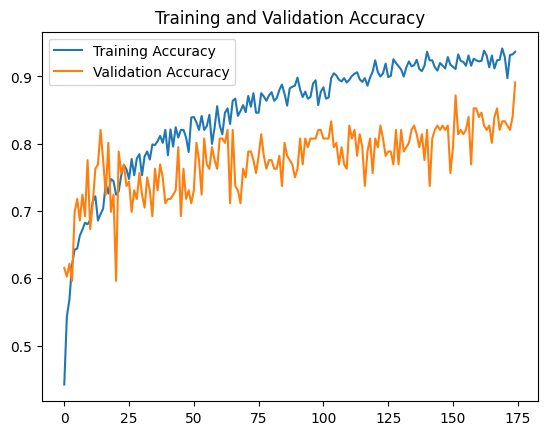

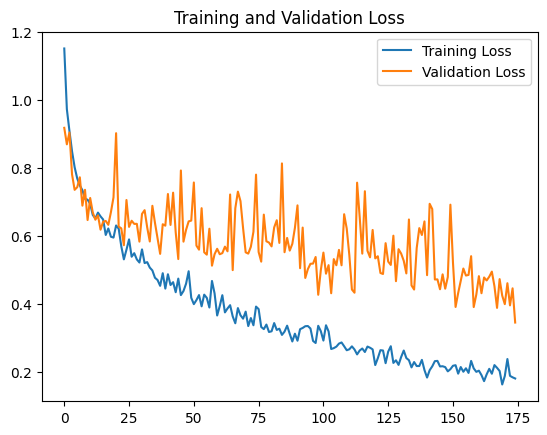

5/5 [==============================] - 38s 7s/step - loss: 0.4966 - accuracy: 0.8836
Test Loss: 0.4966 Test Accuracy: 0.8836
5/5 [==============================] - 37s 7s/step
Confusion Matrix:
 [[35  0  4  0]
 [ 0 39  0  0]
 [ 1  0 37  1]
 [ 5  0  6 18]]
Classification Report:
               precision    recall  f1-score   support

        MILD       0.85      0.90      0.88        39
    MODERATE       1.00      1.00      1.00        39
      NORMAL       0.79      0.95      0.86        39
      SEVERE       0.95      0.62      0.75        29

    accuracy                           0.88       146
   macro avg       0.90      0.87      0.87       146
weighted avg       0.89      0.88      0.88       146



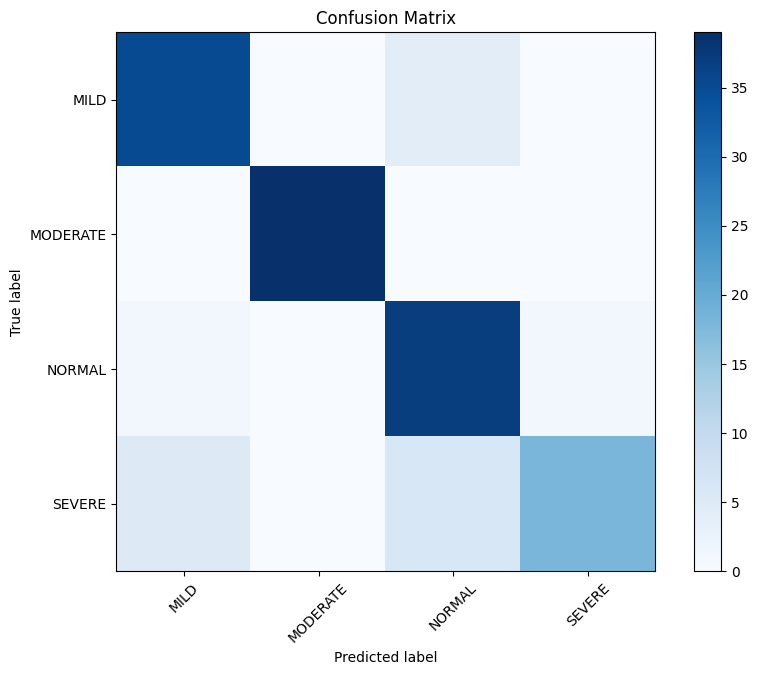

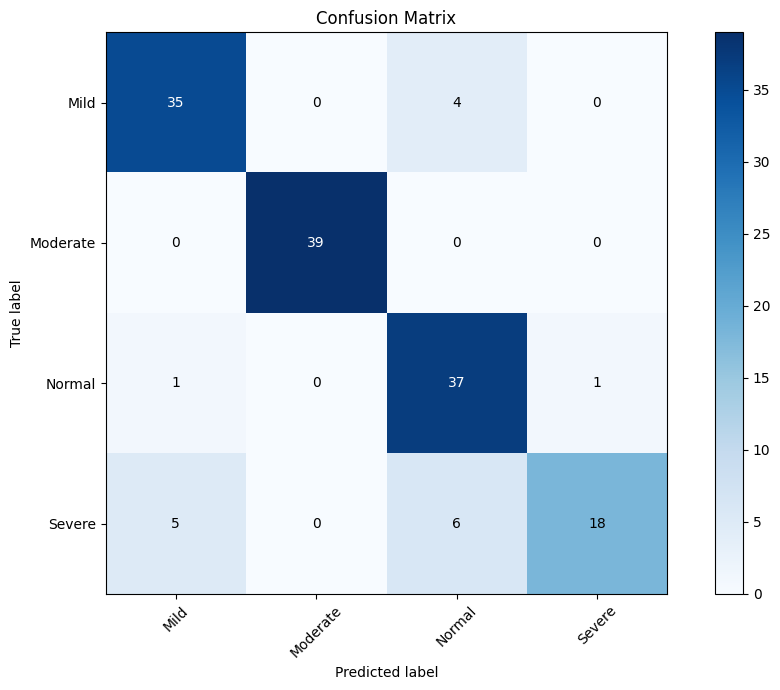

In [37]:
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt

# Data directories
train_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1"
val_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\VAL 1"
test_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TEST 1"

num_classes = 4
batch_size = 16
num_epochs = 175
learning_rate = 0.001
input_shape = (224, 224, 3)  # Modified input shape

# Data augmentation and normalization
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,  # Modified batch size
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,  # Modified batch size
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,  # Modified batch size
    class_mode='categorical',
    shuffle=False
)

# Load pre-trained VGG16 model and modify the final layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
x = base_model.output
x = GlobalAveragePooling2D()(x)    #flatten 
x = Dense(1024, activation='relu')(x) #nurunin dr 1024 sampai ke 4  #drop out tambahin 0,5 #batch normalization
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    epochs=num_epochs,
    validation_data=val_generator
)

# Plot training and validation loss and accuracy
def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(len(acc))

    plt.figure()
    plt.plot(epochs, acc, label='Training Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.figure()
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

plot_history(history)

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(test_generator)
print(f'Test Loss: {test_loss:.4f} Test Accuracy: {test_acc:.4f}')

# Predict on the test set
test_generator.reset()
preds = model.predict(test_generator)
pred_labels = np.argmax(preds, axis=1)
true_labels = test_generator.classes

# Generate confusion matrix and classification report
cm = confusion_matrix(true_labels, pred_labels)
report = classification_report(true_labels, pred_labels, target_names=test_generator.class_indices.keys())

print("Confusion Matrix:\n", cm)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(test_generator.class_indices))
plt.xticks(tick_marks, test_generator.class_indices.keys(), rotation=45)
plt.yticks(tick_marks, test_generator.class_indices.keys())
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


# Define class names (replace these with actual class names)
class_names = ['Mild', 'Moderate', 'Normal', 'Severe']

# Plot confusion matrix
plt.figure(figsize=(10, 7))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

thresh = cm.max() / 2.0  # Midpoint value to determine text color

# Add text inside each cell
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 ha="center", va="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.tight_layout()
plt.show()


In [38]:
# Save the model
model.save('VGG16_model.h5')


c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/175
39/39 [==============================] - 286s 7s/step - loss: 1.1456 - accuracy: 0.4423 - val_loss: 0.9492 - val_accuracy: 0.5577
Epoch 2/175
39/39 [==============================] - 303s 8s/step - loss: 0.9639 - accuracy: 0.5569 - val_loss: 0.8710 - val_accuracy: 0.6410
Epoch 3/175
39/39 [==============================] - 294s 8s/step - loss: 0.9043 - accuracy: 0.5849 - val_loss: 0.8202 - val_accuracy: 0.6218
Epoch 4/175
39/39 [==============================] - 301s 8s/step - loss: 0.8481 - accuracy: 0.6058 - val_loss: 0.8074 - val_accuracy: 0.6795
Epoch 5/175
39/39 [==============================] - 356s 9s/step - loss: 0.8078 - accuracy: 0.6210 - val_loss: 0.7448 - val_accuracy: 0.6154
Epoch 6/175
39/39 [==============================] - 323s 8s/step - loss: 0.7744 - accuracy: 0.6362 - val_loss: 0.7329 - val_accuracy: 0.7372
Epoch 7/175
39/39 [=====

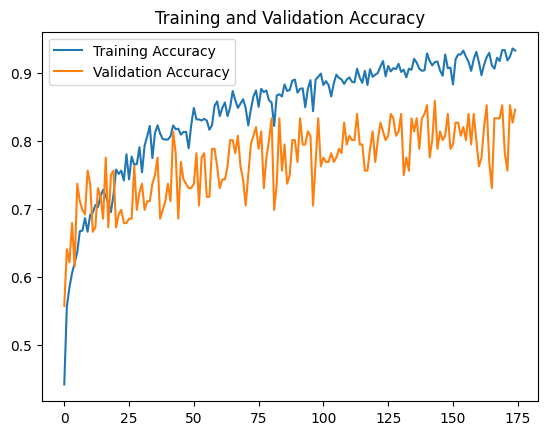

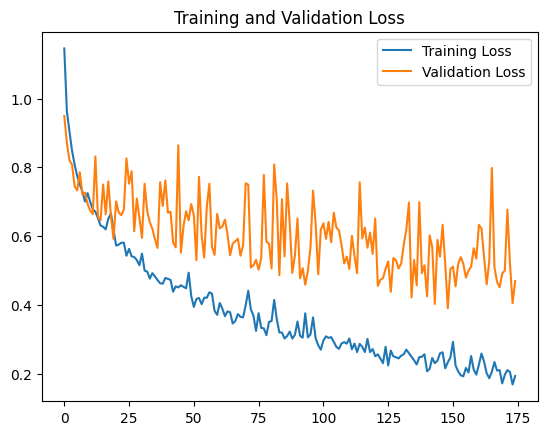

5/5 [==============================] - 31s 6s/step - loss: 0.6042 - accuracy: 0.8493
Test Loss: 0.6042 Test Accuracy: 0.8493
5/5 [==============================] - 31s 6s/step
Confusion Matrix:
 [[36  0  3  0]
 [ 0 39  0  0]
 [ 6  0 33  0]
 [ 8  0  5 16]]
Classification Report:
               precision    recall  f1-score   support

        MILD       0.72      0.92      0.81        39
    MODERATE       1.00      1.00      1.00        39
      NORMAL       0.80      0.85      0.83        39
      SEVERE       1.00      0.55      0.71        29

    accuracy                           0.85       146
   macro avg       0.88      0.83      0.84       146
weighted avg       0.87      0.85      0.84       146



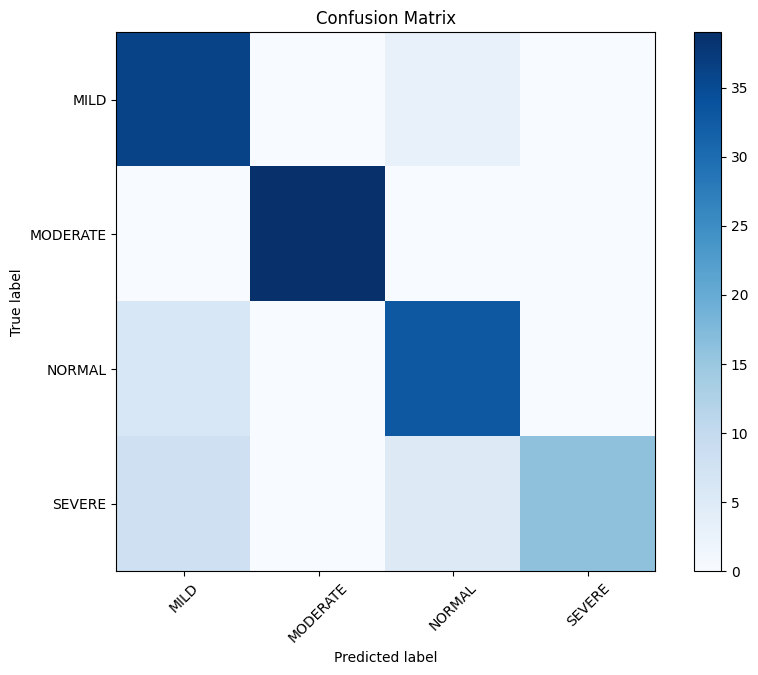

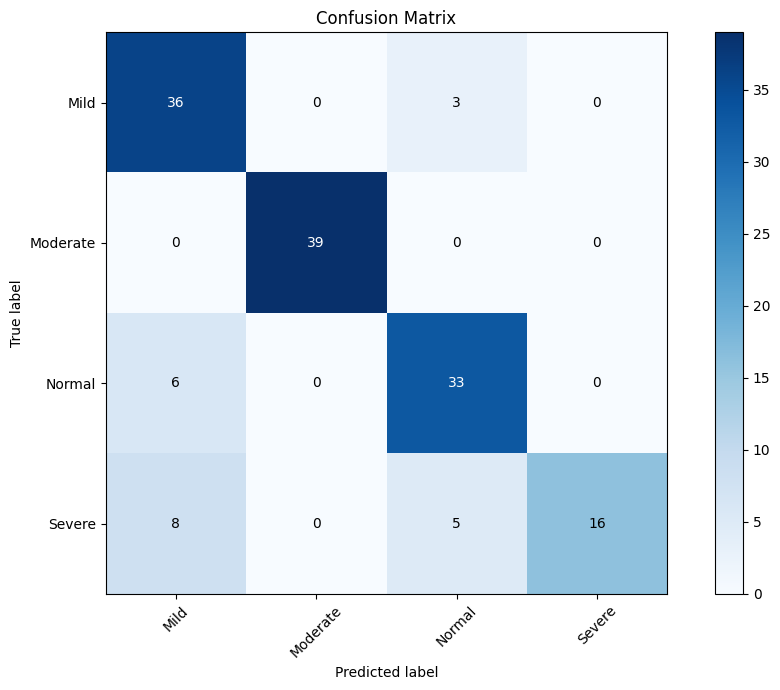

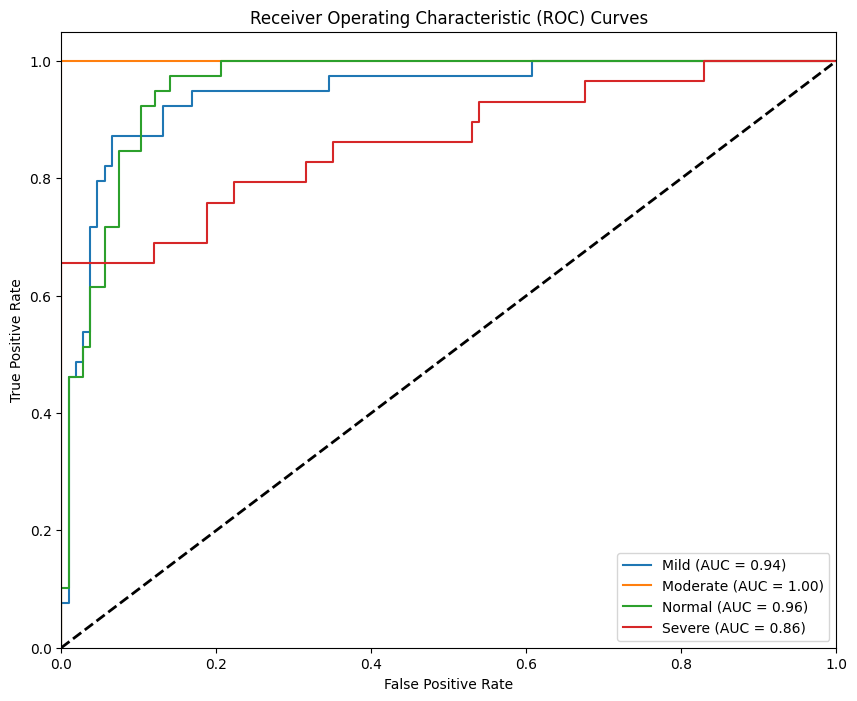

In [1]:
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Data directories
train_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1"
val_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\VAL 1"
test_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TEST 1"

num_classes = 4
batch_size = 32
num_epochs = 175
learning_rate = 0.001
input_shape = (224, 224, 3)  # Modified input shape

# Data augmentation and normalization
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,  # Modified batch size
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,  # Modified batch size
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,  # Modified batch size
    class_mode='categorical',
    shuffle=False
)

# Load pre-trained VGG16 model and modify the final layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
x = base_model.output
x = GlobalAveragePooling2D()(x)    #flatten 
x = Dense(1024, activation='relu')(x) #nurunin dr 1024 sampai ke 4  #drop out tambahin 0,5 #batch normalization
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    epochs=num_epochs,
    validation_data=val_generator
)

# Plot training and validation loss and accuracy
def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(len(acc))

    plt.figure()
    plt.plot(epochs, acc, label='Training Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.figure()
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

plot_history(history)

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(test_generator)
print(f'Test Loss: {test_loss:.4f} Test Accuracy: {test_acc:.4f}')

# Predict on the test set
test_generator.reset()
preds = model.predict(test_generator)
pred_labels = np.argmax(preds, axis=1)
true_labels = test_generator.classes

# Generate confusion matrix and classification report
cm = confusion_matrix(true_labels, pred_labels)
report = classification_report(true_labels, pred_labels, target_names=test_generator.class_indices.keys())

print("Confusion Matrix:\n", cm)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(test_generator.class_indices))
plt.xticks(tick_marks, test_generator.class_indices.keys(), rotation=45)
plt.yticks(tick_marks, test_generator.class_indices.keys())
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

# Define class names (replace these with actual class names)
class_names = ['Mild', 'Moderate', 'Normal', 'Severe']

# Plot confusion matrix
plt.figure(figsize=(10, 7))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

thresh = cm.max() / 2.0  # Midpoint value to determine text color

# Add text inside each cell
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 ha="center", va="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.tight_layout()
plt.show()

# Plot ROC curves and calculate AUC for each class
true_labels_bin = label_binarize(true_labels, classes=list(test_generator.class_indices.values()))
pred_probs = preds

plt.figure(figsize=(10, 8))

for i in range(num_classes):
    fpr, tpr, _ = roc_curve(true_labels_bin[:, i], pred_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_names[i]} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc='lower right')
plt.show()


In [10]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input

# Load the VGG16 model without the top layers
base_model = VGG16(weights='imagenet', include_top=False)

# Choose the layers from which you want to extract feature maps
layer_names = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']
layers_output = [base_model.get_layer(name).output for name in layer_names]

# Create a new model that will output the feature maps from the chosen layers
feature_map_model = Model(inputs=base_model.input, outputs=layers_output)

# Function to load and preprocess the image
def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    return img_array

# Function to extract feature maps
def extract_feature_maps(img_array):
    feature_maps = feature_map_model.predict(img_array)
    return feature_maps

# Function to visualize feature maps with 'viridis' colormap
def visualize_feature_maps_viridis(feature_maps, layer_names):
    for fmap, layer_name in zip(feature_maps, layer_names):
        num_feature_maps = fmap.shape[-1]
        size = fmap.shape[1]
        cols = 8  # Number of columns for subplot grid
        rows = num_feature_maps // cols + (num_feature_maps % cols > 0)
        
        fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
        fig.suptitle(layer_name, fontsize=16)

        for i in range(num_feature_maps):
            row = i // cols
            col = i % cols
            ax = axes[row, col]
            ax.axis('off')
            ax.imshow(fmap[0, :, :, i], cmap='viridis')

        for i in range(num_feature_maps, rows * cols):
            row = i // cols
            col = i % cols
            axes[row, col].axis('off')

        plt.subplots_adjust(wspace=0.1, hspace=0.1)
        plt.show()

# Example usage
img_path = r'C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1\NORMAL\018_aug_0.jpg'
img_array = load_and_preprocess_image(img_path)
feature_maps = extract_feature_maps(img_array)

# Visualize the feature maps with 'viridis' colormap
visualize_feature_maps_viridis(feature_maps, layer_names)


1/1 [==============================] - 1s 530ms/step


In [39]:
import numpy as np

def calculate_metrics(cm):
    num_classes = cm.shape[0]
    sensitivity = np.zeros(num_classes)
    specificity = np.zeros(num_classes)
    
    for i in range(num_classes):
        tp = cm[i, i]
        fn = np.sum(cm[i, :]) - tp
        fp = np.sum(cm[:, i]) - tp
        tn = np.sum(cm) - (tp + fn + fp)
        
        sensitivity[i] = tp / (tp + fn)
        specificity[i] = tn / (tn + fp)
    
    return sensitivity, specificity

# Assuming 'cm' is your confusion matrix
sensitivity, specificity = calculate_metrics(cm)

class_names = ['Mild', 'Moderate', 'Normal', 'Severe']

# Print sensitivity and specificity for each class
for i, class_name in enumerate(class_names):
    print(f'{class_name} - Sensitivity (Recall): {sensitivity[i]:.4f}, Specificity: {specificity[i]:.4f}')


Mild - Sensitivity (Recall): 0.8974, Specificity: 0.9439
Moderate - Sensitivity (Recall): 1.0000, Specificity: 1.0000
Normal - Sensitivity (Recall): 0.9487, Specificity: 0.9065
Severe - Sensitivity (Recall): 0.6207, Specificity: 0.9915


HYPERPARAMATER TUNNING VGG16

In [6]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, classification_report
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define function to create model
def create_model(num_classes):
    base_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    
    for layer in base_model.layers:
        layer.trainable = False
    
    return model

# Training function
def train_model(model, train_generator, val_generator, optimizer, num_epochs):
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    
    history = model.fit(
        train_generator,
        epochs=num_epochs,
        validation_data=val_generator
    )
    
    return history

# Evaluation function
def evaluate_model(model, test_generator):
    predictions = model.predict(test_generator)
    y_pred = np.argmax(predictions, axis=1)
    y_true = test_generator.classes
    
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    conf_matrix = confusion_matrix(y_true, y_pred)
    
    TN = conf_matrix.sum(axis=1) - conf_matrix.diagonal()
    FP = conf_matrix.sum(axis=0) - conf_matrix.diagonal()
    specificity = TN / (TN + FP)
    
    class_report = classification_report(y_true, y_pred, target_names=['NORMAL', 'MILD', 'MODERATE', 'SEVERE'])
    
    return precision, recall, f1, specificity.mean(), conf_matrix, class_report

# Parameter grid
param_grid = {
    'batch_size': [16, 32, 64],
    'optimizer': ['Adam', 'SGD', 'RMSprop'],
    'num_epochs': [75, 100, 200],
    'learning_rate': [0.001]
}

# Image data generators
train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, rotation_range=20)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1"
val_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\VAL 1"
test_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TEST 1"

for params in ParameterGrid(param_grid):
    print(f"Training with parameters: {params}")
    
    train_generator = train_datagen.flow_from_directory(train_dir, target_size=(224, 224), batch_size=params['batch_size'], class_mode='categorical')
    val_generator = val_datagen.flow_from_directory(val_dir, target_size=(224, 224), batch_size=params['batch_size'], class_mode='categorical')
    test_generator = test_datagen.flow_from_directory(test_dir, target_size=(224, 224), batch_size=params['batch_size'], class_mode='categorical', shuffle=False)
    
    if params['optimizer'] == 'Adam':
        optimizer = Adam(learning_rate=params['learning_rate'])
    elif params['optimizer'] == 'SGD':
        optimizer = SGD(learning_rate=params['learning_rate'])
    elif params['optimizer'] == 'RMSprop':
        optimizer = RMSprop(learning_rate=params['learning_rate'])
    
    model = create_model(num_classes=4)  # Adjusted for 4 classes
    
    history = train_model(model, train_generator, val_generator, optimizer, params['num_epochs'])
    
    model_filename = f"vgg16_bs{params['batch_size']}_opt{params['optimizer']}_ep{params['num_epochs']}_lr{params['learning_rate']}.h5"
    model.save(model_filename)
    print(f"Saved {model_filename}")

    history_dict = {
        'Train Loss': history.history['loss'],
        'Train Accuracy': history.history['accuracy'],
        'Val Loss': history.history['val_loss'],
        'Val Accuracy': history.history['val_accuracy']
    }
    history_df = pd.DataFrame(history_dict)
    csv_filename = model_filename.replace('.h5', '.csv')
    history_df.to_csv(csv_filename, index=False)
    
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Training and Validation Loss ({params})')
    plt.legend()
    plt.savefig(model_filename.replace('.h5', '_loss.png'))
    plt.close()
    
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title(f'Training and Validation Accuracy ({params})')
    plt.legend()
    plt.savefig(model_filename.replace('.h5', '_accuracy.png'))
    plt.close()
    
    precision, recall, f1, specificity, conf_matrix, class_report = evaluate_model(model, test_generator)
    
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1-score: {f1:.4f}')
    print(f'Specificity: {specificity:.4f}')
    print('Confusion Matrix:')
    print(conf_matrix)
    
    class_labels = ['NORMAL', 'MILD', 'MODERATE', 'SEVERE']  # Updated class labels
    plt.figure(figsize=(8, 6))
    sns.set(font_scale=1.2)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap=plt.cm.RdPu, xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(f'Confusion Matrix ({params})')
    plt.savefig(model_filename.replace('.h5', '_conf_matrix.png'))
    plt.close()
    
    # Save classification report to a text file
    report_filename = model_filename.replace('.h5', '_class_report.txt')
    with open(report_filename, 'w') as f:
        f.write(class_report)


Training with parameters: {'batch_size': 16, 'learning_rate': 0.001, 'num_epochs': 75, 'optimizer': 'Adam'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/75
78/78 [==============================] - 274s 4s/step - loss: 1.1077 - accuracy: 0.4704 - val_loss: 0.8890 - val_accuracy: 0.5897
Epoch 2/75
78/78 [==============================] - 274s 4s/step - loss: 0.9134 - accuracy: 0.5817 - val_loss: 0.8290 - val_accuracy: 0.6923
Epoch 3/75
78/78 [==============================] - 280s 4s/step - loss: 0.8345 - accuracy: 0.6010 - val_loss: 0.7714 - val_accuracy: 0.5897
Epoch 4/75
78/78 [==============================] - 277s 4s/step - loss: 0.7768 - accuracy: 0.6386 - val_loss: 0.8497 - val_accuracy: 0.6474
Epoch 5/75
78/78 [==============================] - 276s 4s/step - loss: 0.7770 - accuracy: 0.6338 - val_loss: 0.8342 - val_accuracy: 0.4872
Epoch 6/75
78/78 [==============================] - 297s 4s/ste

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved vgg16_bs16_optAdam_ep75_lr0.001.h5
10/10 [==============================] - 44s 4s/step
Precision: 0.8399
Recall: 0.8082
F1-score: 0.8021
Specificity: nan
Confusion Matrix:
[[30  0  9  0]
 [ 0 39  0  0]
 [ 4  0 35  0]
 [ 8  0  7 14]]


C:\Users\lenovo\AppData\Local\Temp\ipykernel_11848\2135016162.py:53: RuntimeWarning: invalid value encountered in divide
  specificity = TN / (TN + FP)


Training with parameters: {'batch_size': 16, 'learning_rate': 0.001, 'num_epochs': 75, 'optimizer': 'SGD'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/75
78/78 [==============================] - 425s 5s/step - loss: 1.3913 - accuracy: 0.2492 - val_loss: 1.3626 - val_accuracy: 0.3462
Epoch 2/75
78/78 [==============================] - 427s 5s/step - loss: 1.3513 - accuracy: 0.4111 - val_loss: 1.3305 - val_accuracy: 0.4679
Epoch 3/75
78/78 [==============================] - 434s 6s/step - loss: 1.3211 - accuracy: 0.4295 - val_loss: 1.3077 - val_accuracy: 0.4679
Epoch 4/75
78/78 [==============================] - 434s 6s/step - loss: 1.2994 - accuracy: 0.4487 - val_loss: 1.2876 - val_accuracy: 0.4167
Epoch 5/75
78/78 [==============================] - 439s 6s/step - loss: 1.2791 - accuracy: 0.4511 - val_loss: 1.2660 - val_accuracy: 0.4872
Epoch 6/75
78/78 [==============================] - 441s 6s/step

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved vgg16_bs16_optSGD_ep75_lr0.001.h5
10/10 [==============================] - 32s 3s/step
Precision: 0.6777
Recall: 0.6644
F1-score: 0.6556
Specificity: 0.5876
Confusion Matrix:
[[33  0  2  4]
 [ 0 34  3  2]
 [15  0 13 11]
 [ 7  0  5 17]]
Training with parameters: {'batch_size': 16, 'learning_rate': 0.001, 'num_epochs': 75, 'optimizer': 'RMSprop'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/75
78/78 [==============================] - 307s 4s/step - loss: 1.1633 - accuracy: 0.4559 - val_loss: 0.9442 - val_accuracy: 0.5449
Epoch 2/75
78/78 [==============================] - 299s 4s/step - loss: 0.9554 - accuracy: 0.5457 - val_loss: 0.8565 - val_accuracy: 0.5321
Epoch 3/75
78/78 [==============================] - 301s 4s/step - loss: 0.8736 - accuracy: 0.5905 - val_loss: 0.8067 - val_accuracy: 0.6538
Epoch 4/75
78/78 [==============================] - 300s 4s/step - loss: 0.8091 - accuracy: 0.6354 -

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved vgg16_bs16_optRMSprop_ep75_lr0.001.h5
10/10 [==============================] - 33s 3s/step
Precision: 0.8361
Recall: 0.8082
F1-score: 0.8062
Specificity: 0.6325
Confusion Matrix:
[[37  0  2  0]
 [ 1 35  0  3]
 [ 8  0 31  0]
 [11  0  3 15]]
Training with parameters: {'batch_size': 16, 'learning_rate': 0.001, 'num_epochs': 100, 'optimizer': 'Adam'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/100
78/78 [==============================] - 323s 4s/step - loss: 1.0968 - accuracy: 0.4752 - val_loss: 0.8910 - val_accuracy: 0.4936
Epoch 2/100
78/78 [==============================] - 279s 4s/step - loss: 0.9188 - accuracy: 0.5641 - val_loss: 0.8324 - val_accuracy: 0.5513
Epoch 3/100
78/78 [==============================] - 319s 4s/step - loss: 0.8403 - accuracy: 0.6034 - val_loss: 0.7600 - val_accuracy: 0.6987
Epoch 4/100
78/78 [==============================] - 294s 4s/step - loss: 0.7795 - accuracy: 0.

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved vgg16_bs16_optAdam_ep100_lr0.001.h5
10/10 [==============================] - 23s 2s/step
Precision: 0.8469
Recall: 0.8288
F1-score: 0.8263
Specificity: nan
Confusion Matrix:
[[26  0 11  2]
 [ 0 39  0  0]
 [ 2  0 37  0]
 [ 4  0  6 19]]


C:\Users\lenovo\AppData\Local\Temp\ipykernel_11848\2135016162.py:53: RuntimeWarning: invalid value encountered in divide
  specificity = TN / (TN + FP)


Training with parameters: {'batch_size': 16, 'learning_rate': 0.001, 'num_epochs': 100, 'optimizer': 'SGD'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/100
78/78 [==============================] - 219s 3s/step - loss: 1.4013 - accuracy: 0.2428 - val_loss: 1.3753 - val_accuracy: 0.2756
Epoch 2/100
78/78 [==============================] - 217s 3s/step - loss: 1.3534 - accuracy: 0.3670 - val_loss: 1.3418 - val_accuracy: 0.4487
Epoch 3/100
78/78 [==============================] - 218s 3s/step - loss: 1.3223 - accuracy: 0.4471 - val_loss: 1.3177 - val_accuracy: 0.4487
Epoch 4/100
78/78 [==============================] - 217s 3s/step - loss: 1.2994 - accuracy: 0.4455 - val_loss: 1.2946 - val_accuracy: 0.4872
Epoch 5/100
78/78 [==============================] - 218s 3s/step - loss: 1.2757 - accuracy: 0.4776 - val_loss: 1.2741 - val_accuracy: 0.4615
Epoch 6/100
78/78 [==============================] - 222s 

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved vgg16_bs16_optSGD_ep100_lr0.001.h5
10/10 [==============================] - 28s 3s/step
Precision: 0.6765
Recall: 0.6438
F1-score: 0.6218
Specificity: 0.6260
Confusion Matrix:
[[34  0  3  2]
 [ 0 33  6  0]
 [16  0 22  1]
 [14  0 10  5]]
Training with parameters: {'batch_size': 16, 'learning_rate': 0.001, 'num_epochs': 100, 'optimizer': 'RMSprop'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/100
78/78 [==============================] - 369s 5s/step - loss: 1.1295 - accuracy: 0.4720 - val_loss: 1.0338 - val_accuracy: 0.6026
Epoch 2/100
78/78 [==============================] - 461s 6s/step - loss: 0.9671 - accuracy: 0.5248 - val_loss: 1.0101 - val_accuracy: 0.4808
Epoch 3/100
78/78 [==============================] - 464s 6s/step - loss: 0.8715 - accuracy: 0.5865 - val_loss: 0.8165 - val_accuracy: 0.5962
Epoch 4/100
78/78 [==============================] - 463s 6s/step - loss: 0.8366 - accuracy: 0.

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved vgg16_bs16_optRMSprop_ep100_lr0.001.h5
10/10 [==============================] - 53s 5s/step
Precision: 0.7933
Recall: 0.7603
F1-score: 0.7574
Specificity: 0.6643
Confusion Matrix:
[[35  0  4  0]
 [ 0 38  0  1]
 [14  0 23  2]
 [11  0  3 15]]
Training with parameters: {'batch_size': 16, 'learning_rate': 0.001, 'num_epochs': 200, 'optimizer': 'Adam'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/200
78/78 [==============================] - 511s 6s/step - loss: 1.0854 - accuracy: 0.4663 - val_loss: 0.8811 - val_accuracy: 0.6154
Epoch 2/200
78/78 [==============================] - 493s 6s/step - loss: 0.8790 - accuracy: 0.5970 - val_loss: 0.7943 - val_accuracy: 0.6731
Epoch 3/200
78/78 [==============================] - 531s 7s/step - loss: 0.7984 - accuracy: 0.6330 - val_loss: 0.7585 - val_accuracy: 0.7115
Epoch 4/200
78/78 [==============================] - 522s 7s/step - loss: 0.7787 - accuracy: 0

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved vgg16_bs16_optAdam_ep200_lr0.001.h5
10/10 [==============================] - 45s 4s/step
Precision: 0.8423
Recall: 0.8082
F1-score: 0.8026
Specificity: 0.6069
Confusion Matrix:
[[32  0  7  0]
 [ 3 34  1  1]
 [ 1  0 38  0]
 [ 5  0 10 14]]
Training with parameters: {'batch_size': 16, 'learning_rate': 0.001, 'num_epochs': 200, 'optimizer': 'SGD'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/200
78/78 [==============================] - 431s 5s/step - loss: 1.3703 - accuracy: 0.3918 - val_loss: 1.3331 - val_accuracy: 0.4679
Epoch 2/200
78/78 [==============================] - 422s 5s/step - loss: 1.3225 - accuracy: 0.4631 - val_loss: 1.3034 - val_accuracy: 0.4872
Epoch 3/200
78/78 [==============================] - 422s 5s/step - loss: 1.2960 - accuracy: 0.4495 - val_loss: 1.2824 - val_accuracy: 0.4679
Epoch 4/200
78/78 [==============================] - 426s 5s/step - loss: 1.2757 - accuracy: 0.460

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved vgg16_bs16_optSGD_ep200_lr0.001.h5
10/10 [==============================] - 48s 5s/step
Precision: 0.7053
Recall: 0.6986
F1-score: 0.6907
Specificity: 0.6078
Confusion Matrix:
[[33  0  2  4]
 [ 0 37  1  1]
 [16  0 16  7]
 [ 6  0  7 16]]
Training with parameters: {'batch_size': 16, 'learning_rate': 0.001, 'num_epochs': 200, 'optimizer': 'RMSprop'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/200
78/78 [==============================] - 465s 6s/step - loss: 1.1371 - accuracy: 0.4800 - val_loss: 1.2135 - val_accuracy: 0.3718
Epoch 2/200
78/78 [==============================] - 444s 6s/step - loss: 0.9591 - accuracy: 0.5393 - val_loss: 0.9408 - val_accuracy: 0.5833
Epoch 3/200
78/78 [==============================] - 456s 6s/step - loss: 0.8550 - accuracy: 0.5841 - val_loss: 0.8273 - val_accuracy: 0.6346
Epoch 4/200
78/78 [==============================] - 496s 6s/step - loss: 0.8110 - accuracy: 0.

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved vgg16_bs16_optRMSprop_ep200_lr0.001.h5
10/10 [==============================] - 47s 5s/step


C:\Users\lenovo\AppData\Local\Temp\ipykernel_11848\2135016162.py:53: RuntimeWarning: invalid value encountered in divide
  specificity = TN / (TN + FP)


Precision: 0.9022
Recall: 0.8699
F1-score: 0.8694
Specificity: nan
Confusion Matrix:
[[30  0  9  0]
 [ 0 39  0  0]
 [ 0  0 39  0]
 [ 2  0  8 19]]
Training with parameters: {'batch_size': 32, 'learning_rate': 0.001, 'num_epochs': 75, 'optimizer': 'Adam'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/75
39/39 [==============================] - 486s 12s/step - loss: 1.0791 - accuracy: 0.5000 - val_loss: 0.9271 - val_accuracy: 0.5962
Epoch 2/75
39/39 [==============================] - 475s 12s/step - loss: 0.9313 - accuracy: 0.5561 - val_loss: 0.8204 - val_accuracy: 0.7115
Epoch 3/75
39/39 [==============================] - 447s 11s/step - loss: 0.8438 - accuracy: 0.6202 - val_loss: 0.7988 - val_accuracy: 0.7308
Epoch 4/75
39/39 [==============================] - 434s 11s/step - loss: 0.8037 - accuracy: 0.6346 - val_loss: 0.7857 - val_accuracy: 0.6346
Epoch 5/75
39/39 [==============================] - 43

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved vgg16_bs32_optAdam_ep75_lr0.001.h5
5/5 [==============================] - 58s 11s/step
Precision: 0.8339
Recall: 0.7877
F1-score: 0.7891
Specificity: 0.6972
Confusion Matrix:
[[35  0  4  0]
 [ 1 38  0  0]
 [12  0 26  1]
 [12  0  1 16]]
Training with parameters: {'batch_size': 32, 'learning_rate': 0.001, 'num_epochs': 75, 'optimizer': 'SGD'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/75
39/39 [==============================] - 614s 16s/step - loss: 1.4011 - accuracy: 0.2228 - val_loss: 1.3826 - val_accuracy: 0.2821
Epoch 2/75
39/39 [==============================] - 588s 15s/step - loss: 1.3750 - accuracy: 0.3149 - val_loss: 1.3622 - val_accuracy: 0.4615
Epoch 3/75
39/39 [==============================] - 619s 16s/step - loss: 1.3539 - accuracy: 0.3846 - val_loss: 1.3468 - val_accuracy: 0.4744
Epoch 4/75
39/39 [==============================] - 616s 16s/step - loss: 1.3393 - accuracy: 0.4840 -

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved vgg16_bs32_optSGD_ep75_lr0.001.h5
5/5 [==============================] - 57s 11s/step
Precision: 0.6713
Recall: 0.6438
F1-score: 0.6168
Specificity: 0.5872
Confusion Matrix:
[[31  0  0  8]
 [ 0 34  4  1]
 [17  0  7 15]
 [ 6  0  1 22]]
Training with parameters: {'batch_size': 32, 'learning_rate': 0.001, 'num_epochs': 75, 'optimizer': 'RMSprop'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/75
39/39 [==============================] - 553s 14s/step - loss: 1.1479 - accuracy: 0.4744 - val_loss: 1.4304 - val_accuracy: 0.2821
Epoch 2/75
39/39 [==============================] - 542s 14s/step - loss: 1.0081 - accuracy: 0.5104 - val_loss: 1.0683 - val_accuracy: 0.4615
Epoch 3/75
39/39 [==============================] - 537s 14s/step - loss: 0.9391 - accuracy: 0.5425 - val_loss: 0.8551 - val_accuracy: 0.5513
Epoch 4/75
39/39 [==============================] - 531s 14s/step - loss: 0.8605 - accuracy: 0.597

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved vgg16_bs32_optRMSprop_ep75_lr0.001.h5
5/5 [==============================] - 29s 5s/step
Precision: 0.8333
Recall: 0.7808
F1-score: 0.7754
Specificity: nan
Confusion Matrix:
[[38  0  1  0]
 [ 0 39  0  0]
 [17  0 20  2]
 [10  0  2 17]]


C:\Users\lenovo\AppData\Local\Temp\ipykernel_11848\2135016162.py:53: RuntimeWarning: invalid value encountered in divide
  specificity = TN / (TN + FP)


Training with parameters: {'batch_size': 32, 'learning_rate': 0.001, 'num_epochs': 100, 'optimizer': 'Adam'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/100
39/39 [==============================] - 273s 7s/step - loss: 1.1555 - accuracy: 0.4407 - val_loss: 0.9854 - val_accuracy: 0.4808
Epoch 2/100
39/39 [==============================] - 258s 7s/step - loss: 0.9617 - accuracy: 0.5449 - val_loss: 0.8665 - val_accuracy: 0.6667
Epoch 3/100
39/39 [==============================] - 292s 8s/step - loss: 0.8738 - accuracy: 0.6042 - val_loss: 0.8466 - val_accuracy: 0.6282
Epoch 4/100
39/39 [==============================] - 292s 7s/step - loss: 0.8564 - accuracy: 0.6010 - val_loss: 0.7938 - val_accuracy: 0.7051
Epoch 5/100
39/39 [==============================] - 263s 7s/step - loss: 0.7734 - accuracy: 0.6851 - val_loss: 0.7548 - val_accuracy: 0.6538
Epoch 6/100
39/39 [==============================] - 285s

: 

In [1]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, classification_report
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define function to create model
def create_model(num_classes):
    base_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    
    for layer in base_model.layers:
        layer.trainable = False
    
    return model

# Training function
def train_model(model, train_generator, val_generator, optimizer, num_epochs):
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    
    history = model.fit(
        train_generator,
        epochs=num_epochs,
        validation_data=val_generator
    )
    
    return history

# Evaluation function
def evaluate_model(model, test_generator):
    predictions = model.predict(test_generator)
    y_pred = np.argmax(predictions, axis=1)
    y_true = test_generator.classes
    
    precision = precision_score(y_true, y_pred, average='weighted')
    recall = recall_score(y_true, y_pred, average='weighted')
    f1 = f1_score(y_true, y_pred, average='weighted')
    conf_matrix = confusion_matrix(y_true, y_pred)
    
    TN = conf_matrix.sum(axis=1) - conf_matrix.diagonal()
    FP = conf_matrix.sum(axis=0) - conf_matrix.diagonal()
    specificity = TN / (TN + FP)
    
    class_report = classification_report(y_true, y_pred, target_names=['NORMAL', 'MILD', 'MODERATE', 'SEVERE'])
    
    return precision, recall, f1, specificity.mean(), conf_matrix, class_report

# Parameter grid
param_grid = {
    'batch_size': [32],
    'optimizer': ['SGD', 'RMSprop', 'Adam'],
    'num_epochs': [100, 200],
    'learning_rate': [0.001]
}

# Image data generators
train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, rotation_range=20)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1"
val_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\VAL 1"
test_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TEST 1"

for params in ParameterGrid(param_grid):
    print(f"Training with parameters: {params}")
    
    train_generator = train_datagen.flow_from_directory(train_dir, target_size=(224, 224), batch_size=params['batch_size'], class_mode='categorical')
    val_generator = val_datagen.flow_from_directory(val_dir, target_size=(224, 224), batch_size=params['batch_size'], class_mode='categorical')
    test_generator = test_datagen.flow_from_directory(test_dir, target_size=(224, 224), batch_size=params['batch_size'], class_mode='categorical', shuffle=False)
    
    if params['optimizer'] == 'Adam':
        optimizer = Adam(learning_rate=params['learning_rate'])
    elif params['optimizer'] == 'SGD':
        optimizer = SGD(learning_rate=params['learning_rate'])
    elif params['optimizer'] == 'RMSprop':
        optimizer = RMSprop(learning_rate=params['learning_rate'])
    
    model = create_model(num_classes=4)  # Adjusted for 4 classes
    
    history = train_model(model, train_generator, val_generator, optimizer, params['num_epochs'])
    
    model_filename = f"vgg16_bs{params['batch_size']}_opt{params['optimizer']}_ep{params['num_epochs']}_lr{params['learning_rate']}.h5"
    model.save(model_filename)
    print(f"Saved {model_filename}")

    history_dict = {
        'Train Loss': history.history['loss'],
        'Train Accuracy': history.history['accuracy'],
        'Val Loss': history.history['val_loss'],
        'Val Accuracy': history.history['val_accuracy']
    }
    history_df = pd.DataFrame(history_dict)
    csv_filename = model_filename.replace('.h5', '.csv')
    history_df.to_csv(csv_filename, index=False)
    
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Training and Validation Loss ({params})')
    plt.legend()
    plt.savefig(model_filename.replace('.h5', '_loss.png'))
    plt.close()
    
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Val Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title(f'Training and Validation Accuracy ({params})')
    plt.legend()
    plt.savefig(model_filename.replace('.h5', '_accuracy.png'))
    plt.close()
    
    precision, recall, f1, specificity, conf_matrix, class_report = evaluate_model(model, test_generator)
    
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1-score: {f1:.4f}')
    print(f'Specificity: {specificity:.4f}')
    print('Confusion Matrix:')
    print(conf_matrix)
    
    class_labels = ['NORMAL', 'MILD', 'MODERATE', 'SEVERE']  # Updated class labels
    plt.figure(figsize=(8, 6))
    sns.set(font_scale=1.2)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap=plt.cm.RdPu, xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(f'Confusion Matrix ({params})')
    plt.savefig(model_filename.replace('.h5', '_conf_matrix.png'))
    plt.close()
    
    # Save classification report to a text file
    report_filename = model_filename.replace('.h5', '_class_report.txt')
    with open(report_filename, 'w') as f:
        f.write(class_report)


Training with parameters: {'batch_size': 32, 'learning_rate': 0.001, 'num_epochs': 100, 'optimizer': 'SGD'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/100
39/39 [==============================] - 266s 7s/step - loss: 1.4418 - accuracy: 0.2708 - val_loss: 1.3829 - val_accuracy: 0.3077
Epoch 2/100
39/39 [==============================] - 287s 7s/step - loss: 1.3756 - accuracy: 0.3101 - val_loss: 1.3622 - val_accuracy: 0.4423
Epoch 3/100
39/39 [==============================] - 237s 6s/step - loss: 1.3588 - accuracy: 0.4030 - val_loss: 1.3462 - val_accuracy: 0.3974
Epoch 4/100
39/39 [==============================] - 295s 8s/step - loss: 1.3435 - accuracy: 0.4087 - val_loss: 1.3328 - val_accuracy: 0.4038
Epoch 5/100
39/39 [==============================] - 265s 7s/step - loss: 1.3302 - accuracy: 0.4071 - val_loss: 1.3198 - val_accuracy: 0.4615
Epoch 6/100
39/39 [==============================] - 241s 

c:\Users\lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Saved vgg16_bs32_optSGD_ep100_lr0.001.h5
5/5 [==============================] - 78s 14s/step
Precision: 0.6637
Recall: 0.6507
F1-score: 0.6460
Specificity: 0.6095
Confusion Matrix:
[[32  0  4  3]
 [ 0 34  4  1]
 [16  0 18  5]
 [ 9  0  9 11]]
Training with parameters: {'batch_size': 32, 'learning_rate': 0.001, 'num_epochs': 100, 'optimizer': 'RMSprop'}
Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/100
39/39 [==============================] - 737s 19s/step - loss: 1.1484 - accuracy: 0.4639 - val_loss: 1.0893 - val_accuracy: 0.5321
Epoch 2/100
39/39 [==============================] - 690s 18s/step - loss: 0.9938 - accuracy: 0.5176 - val_loss: 0.9609 - val_accuracy: 0.6154
Epoch 3/100
39/39 [==============================] - 592s 15s/step - loss: 0.9098 - accuracy: 0.5633 - val_loss: 1.0566 - val_accuracy: 0.4679
Epoch 4/100
39/39 [==============================] - 562s 14s/step - loss: 0.8829 - accuracy:

: 

ABLATION STUDY

Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/175
39/39 [==============================] - 272s 7s/step - loss: 1.3220 - accuracy: 0.5345 - val_loss: 2.1981 - val_accuracy: 0.3782
Epoch 2/175
39/39 [==============================] - 268s 7s/step - loss: 0.9155 - accuracy: 0.6370 - val_loss: 2.1179 - val_accuracy: 0.4615
Epoch 3/175
39/39 [==============================] - 270s 7s/step - loss: 0.8080 - accuracy: 0.6699 - val_loss: 2.6221 - val_accuracy: 0.4167
Epoch 4/175
39/39 [==============================] - 305s 8s/step - loss: 0.7521 - accuracy: 0.6635 - val_loss: 1.5987 - val_accuracy: 0.5128
Epoch 5/175
39/39 [==============================] - 307s 8s/step - loss: 0.6833 - accuracy: 0.7147 - val_loss: 0.8540 - val_accuracy: 0.6474
Epoch 6/175
39/39 [==============================] - 308s 8s/step - loss: 0.6737 - accuracy: 0.7043 - val_loss: 1.0965 - val_accuracy: 0.6154
Epoch 7/175
39/39 [=====

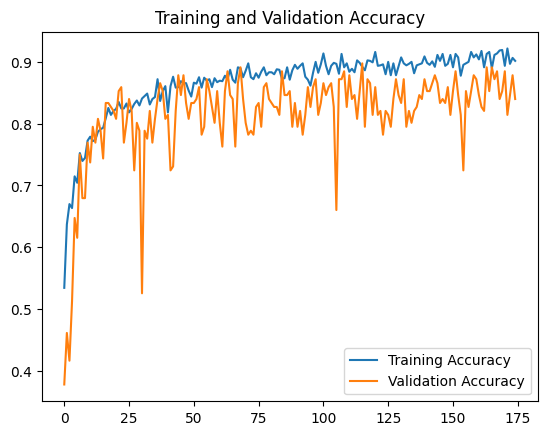

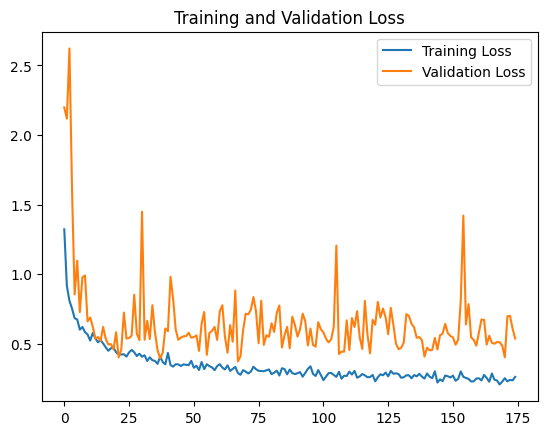

5/5 [==============================] - 27s 5s/step - loss: 0.9574 - accuracy: 0.7808
Test Loss: 0.9574 Test Accuracy: 0.7808
5/5 [==============================] - 28s 5s/step
Confusion Matrix:
 [[19  0 16  4]
 [ 0 39  0  0]
 [ 0  0 39  0]
 [ 5  0  7 17]]
Classification Report:
               precision    recall  f1-score   support

        MILD       0.79      0.49      0.60        39
    MODERATE       1.00      1.00      1.00        39
      NORMAL       0.63      1.00      0.77        39
      SEVERE       0.81      0.59      0.68        29

    accuracy                           0.78       146
   macro avg       0.81      0.77      0.76       146
weighted avg       0.81      0.78      0.77       146



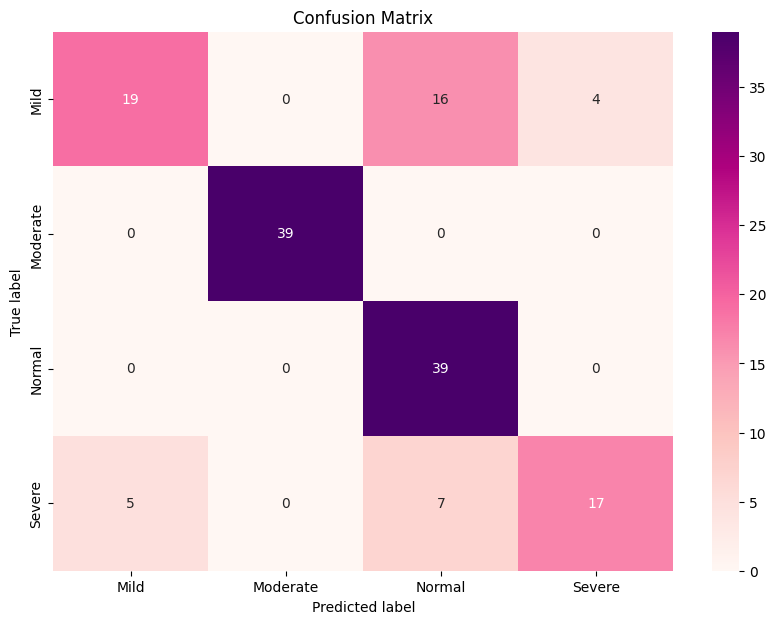

In [1]:
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Flatten, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import seaborn as sns

# Data directories
train_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1"
val_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\VAL 1"
test_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TEST 1"

num_classes = 4
batch_size = 32
num_epochs = 175
learning_rate = 0.001
input_shape = (224, 224, 3)

# Data augmentation and normalization
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Load pre-trained VGG16 model and modify the final layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
x = base_model.output
x = Flatten()(x)  # Add Flatten layer
x = Dense(512, activation='relu')(x)  # Reduce dense layer units from 1024 to 512
x = BatchNormalization()(x)  # Add batch normalization
x = Dropout(0.5)(x)  # Add dropout layer with 0.5 rate

predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    epochs=num_epochs,
    validation_data=val_generator
)

# Plot training and validation loss and accuracy
def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(len(acc))

    plt.figure()
    plt.plot(epochs, acc, label='Training Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.figure()
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

plot_history(history)

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(test_generator)
print(f'Test Loss: {test_loss:.4f} Test Accuracy: {test_acc:.4f}')

# Predict on the test set
test_generator.reset()
preds = model.predict(test_generator)
pred_labels = np.argmax(preds, axis=1)
true_labels = test_generator.classes

# Generate confusion matrix and classification report
cm = confusion_matrix(true_labels, pred_labels)
report = classification_report(true_labels, pred_labels, target_names=test_generator.class_indices.keys())

print("Confusion Matrix:\n", cm)
print("Classification Report:\n", report)

# Define class names (replace these with actual class names)
class_names = ['Mild', 'Moderate', 'Normal', 'Severe']

# Plot confusion matrix using sns.heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.RdPu, xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


In [ ]:
# Save the model
model_path = 'trained_modelVGG16.h5'
model.save(model_path)
print(f'Model saved to {model_path}')


Number of training samples: 1248
Number of validation samples: 156
Number of test samples: 146
Epoch 1/175
----------
train Loss: 1.1947 Acc: 0.5513
val Loss: 1.1361 Acc: 0.6218
Epoch 2/175
----------
train Loss: 1.0719 Acc: 0.6939
val Loss: 1.0567 Acc: 0.6923
Epoch 3/175
----------
train Loss: 1.0165 Acc: 0.7524
val Loss: 1.0149 Acc: 0.7692
Epoch 4/175
----------
train Loss: 0.9620 Acc: 0.8101
val Loss: 0.9628 Acc: 0.8397
Epoch 5/175
----------
train Loss: 0.9328 Acc: 0.8405
val Loss: 0.9553 Acc: 0.8269
Epoch 6/175
----------
train Loss: 0.9009 Acc: 0.8678
val Loss: 0.9229 Acc: 0.8462
Epoch 7/175
----------
train Loss: 0.8839 Acc: 0.8894
val Loss: 0.9318 Acc: 0.8269
Epoch 8/175
----------
train Loss: 0.8687 Acc: 0.8966
val Loss: 0.9225 Acc: 0.8333
Epoch 9/175
----------
train Loss: 0.8516 Acc: 0.9087
val Loss: 0.9235 Acc: 0.8269
Epoch 10/175
----------
train Loss: 0.8489 Acc: 0.9079
val Loss: 0.9193 Acc: 0.8205
Epoch 11/175
----------
train Loss: 0.8272 Acc: 0.9335
val Loss: 0.8939 Ac

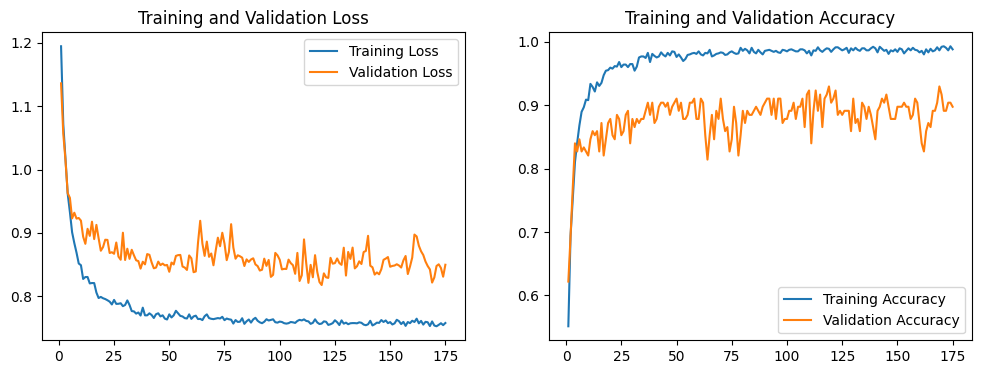

Test Accuracy: 0.7945
Confusion Matrix:
 [[23  0 10  6]
 [ 0 39  0  0]
 [ 0  0 39  0]
 [ 8  0  6 15]]
Classification Report:
               precision    recall  f1-score   support

        Mild       0.74      0.59      0.66        39
    Moderate       1.00      1.00      1.00        39
      Normal       0.71      1.00      0.83        39
      Severe       0.71      0.52      0.60        29

    accuracy                           0.79       146
   macro avg       0.79      0.78      0.77       146
weighted avg       0.80      0.79      0.78       146



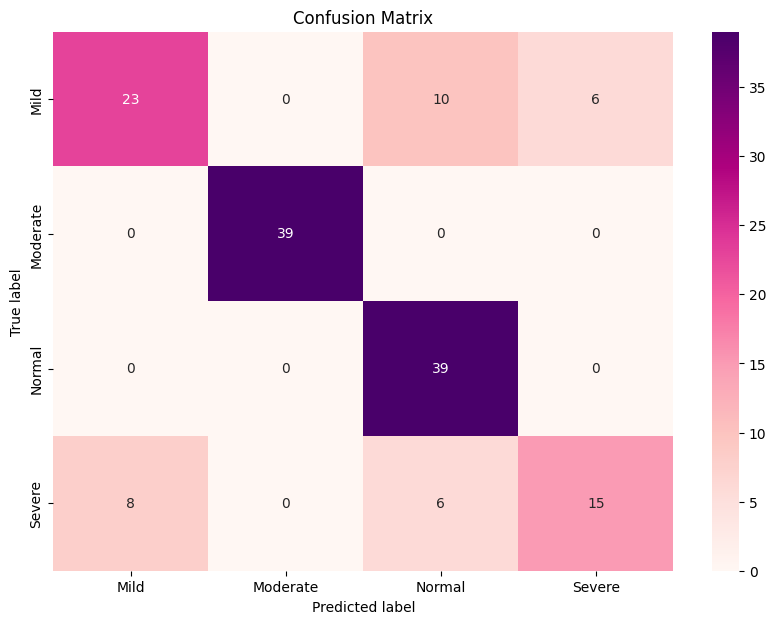

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

# Data directories
train_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1"
val_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\VAL 1"
test_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TEST 1"

num_classes = 4
batch_size = 32
num_epochs = 175
learning_rate = 0.0001
input_size = 224

# Data augmentation and normalization
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((input_size, input_size)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.RandomRotation(10),
        transforms.ColorJitter(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((input_size, input_size)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize((input_size, input_size)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
}

# Load datasets
image_datasets = {
    'train': datasets.ImageFolder(train_dir, data_transforms['train']),
    'val': datasets.ImageFolder(val_dir, data_transforms['val']),
    'test': datasets.ImageFolder(test_dir, data_transforms['test'])
}

# Print the number of samples in each dataset
print(f"Number of training samples: {len(image_datasets['train'])}")
print(f"Number of validation samples: {len(image_datasets['val'])}")
print(f"Number of test samples: {len(image_datasets['test'])}")

# Create data loaders
dataloaders = {
    'train': DataLoader(image_datasets['train'], batch_size=batch_size, shuffle=True),
    'val': DataLoader(image_datasets['val'], batch_size=batch_size, shuffle=False),
    'test': DataLoader(image_datasets['test'], batch_size=batch_size, shuffle=False)
}

# Define class names (replace these with actual class names)
class_names = ['Mild', 'Moderate', 'Normal', 'Severe']

# Load pre-trained VGG16 model and modify the final layers
model = models.vgg16(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.classifier[0].in_features
model.classifier = nn.Sequential(
    nn.Linear(num_ftrs, 1024),
    nn.ReLU(),
    nn.BatchNorm1d(1024),
    nn.Dropout(0.5),
    nn.Linear(1024, 512),
    nn.ReLU(),
    nn.BatchNorm1d(512),
    nn.Dropout(0.5),
    nn.Linear(512, num_classes),
    nn.Softmax(dim=1)
)

# Move model to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Training and validation loop
train_acc_history = []
val_acc_history = []
train_loss_history = []
val_loss_history = []

for epoch in range(num_epochs):
    print(f'Epoch {epoch+1}/{num_epochs}')
    print('-' * 10)

    # Each epoch has a training and validation phase
    for phase in ['train', 'val']:
        if phase == 'train':
            model.train()
        else:
            model.eval()

        running_loss = 0.0
        running_corrects = 0

        # Iterate over data
        for inputs, labels in dataloaders[phase]:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass
            with torch.set_grad_enabled(phase == 'train'):
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                # Backward pass and optimize only if in training phase
                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            # Statistics
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(image_datasets[phase])
        epoch_acc = running_corrects.double() / len(image_datasets[phase])

        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

        if phase == 'train':
            train_loss_history.append(epoch_loss)
            train_acc_history.append(epoch_acc)
        else:
            val_loss_history.append(epoch_loss)
            val_acc_history.append(epoch_acc)

# Plot training and validation loss and accuracy
def plot_history(train_loss, val_loss, train_acc, val_acc):
    epochs = range(1, len(train_loss) + 1)

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_acc, label='Training Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.show()

plot_history(train_loss_history, val_loss_history, train_acc_history, val_acc_history)

# Evaluate the model on the test set
model.eval()
test_corrects = 0
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in dataloaders['test']:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        test_corrects += torch.sum(preds == labels.data)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = test_corrects.double() / len(image_datasets['test'])
print(f'Test Accuracy: {test_acc:.4f}')

# Generate confusion matrix and classification report
cm = confusion_matrix(all_labels, all_preds)
report = classification_report(all_labels, all_preds, target_names=class_names)

print("Confusion Matrix:\n", cm)
print("Classification Report:\n", report)

# Plot confusion matrix using sns.heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.RdPu, xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


In [19]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

# Data directories
train_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1"
val_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\VAL 1"
test_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TEST 1"

num_classes = 4
batch_size = 32
num_epochs = 175
learning_rate = 0.0001
input_size = 224

# Data augmentation and normalization
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((input_size, input_size)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.RandomRotation(10),
        transforms.ColorJitter(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((input_size, input_size)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'test': transforms.Compose([
        transforms.Resize((input_size, input_size)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
}

# Load datasets
image_datasets = {
    'train': datasets.ImageFolder(train_dir, data_transforms['train']),
    'val': datasets.ImageFolder(val_dir, data_transforms['val']),
    'test': datasets.ImageFolder(test_dir, data_transforms['test'])
}

# Print the number of samples in each dataset
print(f"Number of training samples: {len(image_datasets['train'])}")
print(f"Number of validation samples: {len(image_datasets['val'])}")
print(f"Number of test samples: {len(image_datasets['test'])}")

# Create data loaders
dataloaders = {
    'train': DataLoader(image_datasets['train'], batch_size=batch_size, shuffle=True),
    'val': DataLoader(image_datasets['val'], batch_size=batch_size, shuffle=False),
    'test': DataLoader(image_datasets['test'], batch_size=batch_size, shuffle=False)
}

# Define class names (replace these with actual class names)
class_names = ['Mild', 'Moderate', 'Normal', 'Severe']

# Load pre-trained VGG16 model and modify the final layers
model = models.vgg16(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

num_ftrs = model.classifier[0].in_features
model.classifier = nn.Sequential(
    nn.Linear(num_ftrs, 1024),
    nn.ReLU(),
    #nn.BatchNorm1d(1024),
    nn.Dropout(0.5),
    nn.Linear(1024, 512),
    nn.ReLU(),
    #nn.BatchNorm1d(512),
    nn.Dropout(0.5),
    nn.Linear(512, num_classes),
    nn.Softmax(dim=1)
)

# Move model to GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Training and validation loop
train_acc_history = []
val_acc_history = []
train_loss_history = []
val_loss_history = []

for epoch in range(num_epochs):
    print(f'Epoch {epoch+1}/{num_epochs}')
    print('-' * 10)

    # Each epoch has a training and validation phase
    for phase in ['train', 'val']:
        if phase == 'train':
            model.train()
        else:
            model.eval()

        running_loss = 0.0
        running_corrects = 0

        # Iterate over data
        for inputs, labels in dataloaders[phase]:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward pass
            with torch.set_grad_enabled(phase == 'train'):
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                # Backward pass and optimize only if in training phase
                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            # Statistics
            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(image_datasets[phase])
        epoch_acc = running_corrects.double() / len(image_datasets[phase])

        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

        if phase == 'train':
            train_loss_history.append(epoch_loss)
            train_acc_history.append(epoch_acc)
        else:
            val_loss_history.append(epoch_loss)
            val_acc_history.append(epoch_acc)

# Plot training and validation loss and accuracy
def plot_history(train_loss, val_loss, train_acc, val_acc):
    epochs = range(1, len(train_loss) + 1)

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_acc, label='Training Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.show()

plot_history(train_loss_history, val_loss_history, train_acc_history, val_acc_history)

# Evaluate the model on the test set
model.eval()
test_corrects = 0
all_preds = []
all_labels = []

with torch.no_grad():
    for inputs, labels in dataloaders['test']:
        inputs = inputs.to(device)
        labels = labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        test_corrects += torch.sum(preds == labels.data)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

test_acc = test_corrects.double() / len(image_datasets['test'])
print(f'Test Accuracy: {test_acc:.4f}')

# Generate confusion matrix and classification report
cm = confusion_matrix(all_labels, all_preds)
report = classification_report(all_labels, all_preds, target_names=class_names)

print("Confusion Matrix:\n", cm)
print("Classification Report:\n", report)

# Plot confusion matrix using sns.heatmap
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap=plt.cm.RdPu, xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

SyntaxError: invalid syntax (1691758650.py, line 1)

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt

# Data directories
train_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TRAIN 1"
val_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\VAL 1"
test_dir = r"C:\Users\lenovo\Downloads\TA\ORIGA DATASET\image cropped class\image orii\TEST 1"

num_classes = 4
batch_size = 32  # Modified batch size
num_epochs = 175
learning_rate = 0.001
input_shape = (224, 224, 3)

# Data augmentation and normalization
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Load pre-trained VGG16 model and modify the final layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Initial training with only the top layers
initial_epochs = 50
history = model.fit(
    train_generator,
    epochs=initial_epochs,
    validation_data=val_generator
)

# Unfreeze some layers in the base model and continue training
for layer in base_model.layers[:15]:  # Adjust the number of layers to unfreeze
    layer.trainable = True

# Recompile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=learning_rate / 10),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Continue training with some layers unfrozen
second_epochs = 50
history_2 = model.fit(
    train_generator,
    epochs=second_epochs,
    validation_data=val_generator,
    initial_epoch=initial_epochs
)

# Unfreeze all layers in the base model and continue training
for layer in base_model.layers:
    layer.trainable = True

# Recompile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=learning_rate / 100),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Continue training with all layers unfrozen
final_epochs = 75
history_3 = model.fit(
    train_generator,
    epochs=final_epochs,
    validation_data=val_generator,
    initial_epoch=initial_epochs + second_epochs
)

# Combine the history objects
history.history['accuracy'] += history_2.history['accuracy'] + history_3.history['accuracy']
history.history['val_accuracy'] += history_2.history['val_accuracy'] + history_3.history['val_accuracy']
history.history['loss'] += history_2.history['loss'] + history_3.history['loss']
history.history['val_loss'] += history_2.history['val_loss'] + history_3.history['val_loss']

# Plot training and validation loss and accuracy
def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(len(acc))

    plt.figure()
    plt.plot(epochs, acc, label='Training Accuracy')
    plt.plot(epochs, val_acc, label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()

    plt.figure()
    plt.plot(epochs, loss, label='Training Loss')
    plt.plot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

plot_history(history)

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(test_generator)
print(f'Test Loss: {test_loss:.4f} Test Accuracy: {test_acc:.4f}')

# Predict on the test set
test_generator.reset()
preds = model.predict(test_generator)
pred_labels = np.argmax(preds, axis=1)
true_labels = test_generator.classes

# Generate confusion matrix and classification report
cm = confusion_matrix(true_labels, pred_labels)
report = classification_report(true_labels, pred_labels, target_names=test_generator.class_indices.keys())

print("Confusion Matrix:\n", cm)
print("Classification Report:\n", report)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(test_generator.class_indices))
plt.xticks(tick_marks, test_generator.class_indices.keys(), rotation=45)
plt.yticks(tick_marks, test_generator.class_indices.keys())
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

# Define class names (replace these with actual class names)
class_names = ['Mild', 'Moderate', 'Normal', 'Severe']

# Plot confusion matrix
plt.figure(figsize=(10, 7))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

thresh = cm.max() / 2.0  # Midpoint value to determine text color

# Add text inside each cell
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 ha="center", va="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.tight_layout()
plt.show()


Found 1248 images belonging to 4 classes.
Found 156 images belonging to 4 classes.
Found 146 images belonging to 4 classes.
Epoch 1/50
39/39 [==============================] - 446s 11s/step - loss: 1.1079 - accuracy: 0.4415 - val_loss: 0.9460 - val_accuracy: 0.5705
Epoch 2/50
39/39 [==============================] - 443s 11s/step - loss: 0.9753 - accuracy: 0.5377 - val_loss: 0.8713 - val_accuracy: 0.6923
Epoch 3/50
39/39 [==============================] - 407s 10s/step - loss: 0.8905 - accuracy: 0.5809 - val_loss: 0.9326 - val_accuracy: 0.6218
Epoch 4/50
39/39 [==============================] - 404s 10s/step - loss: 0.8389 - accuracy: 0.6194 - val_loss: 0.8354 - val_accuracy: 0.6090
Epoch 5/50
39/39 [==============================] - 402s 10s/step - loss: 0.8379 - accuracy: 0.6178 - val_loss: 0.7462 - val_accuracy: 0.7115
Epoch 6/50
39/39 [==============================] - 400s 10s/step - loss: 0.7705 - accuracy: 0.6538 - val_loss: 0.7947 - val_accuracy: 0.6859
Epoch 7/50
39/39 [======

KeyError: 'accuracy'